In [1]:
import os
import io
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image
from rdkit import Chem
from sklearn.svm import SVR
import matplotlib.pyplot as plt
from rdkit.Chem import Descriptors
from rdkit.Chem import AllChem, Draw
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

Dataset loaded successfully.
Initial shape: (9982, 26)

--- Data Cleaning and EDA ---

Missing values:
ID                     0
Name                   0
InChI                  0
InChIKey               0
SMILES                 0
Solubility             0
SD                     0
Ocurrences             0
Group                  0
MolWt                  0
MolLogP                0
MolMR                  0
HeavyAtomCount         0
NumHAcceptors          0
NumHDonors             0
NumHeteroatoms         0
NumRotatableBonds      0
NumValenceElectrons    0
NumAromaticRings       0
NumSaturatedRings      0
NumAliphaticRings      0
RingCount              0
TPSA                   0
LabuteASA              0
BalabanJ               0
BertzCT                0
dtype: int64

Shape after dropping missing values: (9982, 26)

Number of duplicate rows: 0
Shape after removing duplicates: (9982, 26)

Shape after removing outliers: (7201, 26)

Basic statistics of numerical features:
             MolWt      MolL

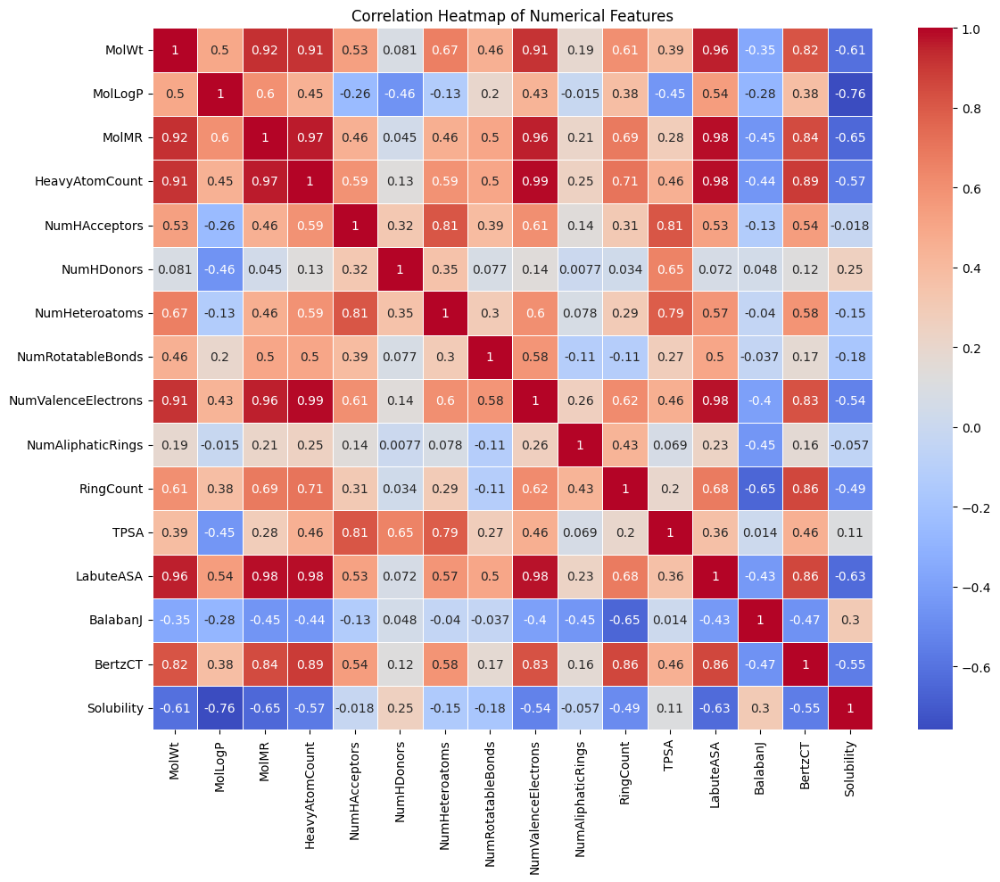

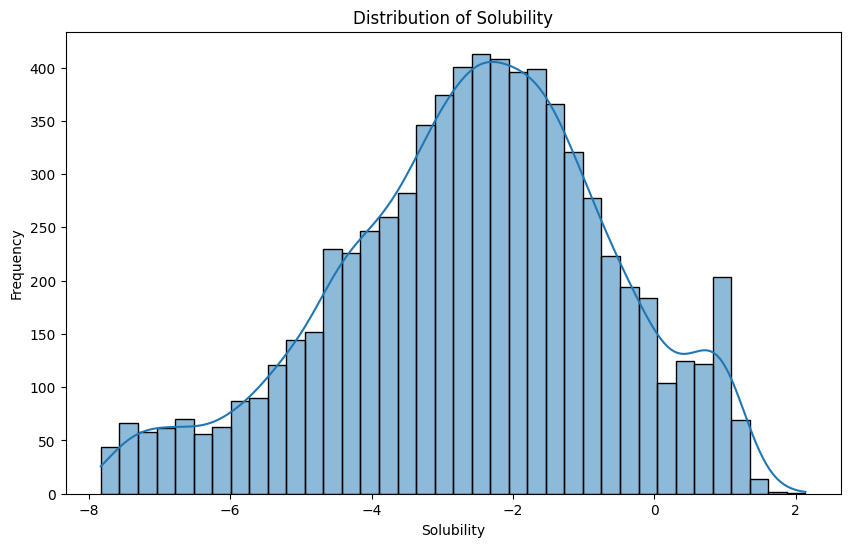


Cleaned dataset saved to cleaned_solubility_dataset.csv
Cleaned dataset loaded successfully.

 Linear Regression:
mean squared error: 1.2844
R2: 0.6595

 Decision Tree:
mean squared error: 1.5752
R2: 0.5825


In [2]:
file_path = r"curated-solubility-dataset.csv"
cleaned_file_path = r"cleaned_solubility_dataset.csv"

# Verify whether the file exist or not!
if not os.path.exists(file_path):
    raise FileNotFoundError(f"The file {file_path} does not exist. Please check the path.")

# Loading dataset
try:
    df = pd.read_csv(file_path)
    print("Dataset loaded successfully.")
    print(f"Initial shape: {df.shape}")
except Exception as e:
    print(f"Error loading the dataset: {e}")
    raise

# Data Cleaning and EDA
print("\n--- Data Cleaning and EDA ---")

# Check if there are any missing values
print("\nMissing values:")
print(df.isnull().sum())

# Handling of missing values
df_cleaned = df.dropna()
print(f"\nShape after dropping missing values: {df_cleaned.shape}")

# Check if there are any duplicates
duplicates = df_cleaned.duplicated().sum()
print(f"\nNumber of duplicate rows: {duplicates}")
df_cleaned = df_cleaned.drop_duplicates()
print(f"Shape after removing duplicates: {df_cleaned.shape}")

# calling the numerical features
numerical_features = ['MolWt', 'MolLogP', 'MolMR', 'HeavyAtomCount', 'NumHAcceptors', 'NumHDonors', 
                      'NumHeteroatoms', 'NumRotatableBonds', 'NumValenceElectrons', 'NumAliphaticRings', 
                      'RingCount', 'TPSA', 'LabuteASA', 'BalabanJ', 'BertzCT', 'Solubility']

# Using IQR method to handle outliers
for feature in numerical_features:
    Q1 = df_cleaned[feature].quantile(0.25)
    Q3 = df_cleaned[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df_cleaned = df_cleaned[(df_cleaned[feature] >= lower_bound) & (df_cleaned[feature] <= upper_bound)]

print(f"\nShape after removing outliers: {df_cleaned.shape}")

# Display some basic statistics
print("\nBasic statistics of numerical features:")
print(df_cleaned[numerical_features].describe())

# The correlation matrix
correlation_matrix = df_cleaned[numerical_features].corr()

# Plot the correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap of Numerical Features')
plt.tight_layout()
plt.show()

# Distribution of Solubility
plt.figure(figsize=(10, 6))
sns.histplot(df_cleaned['Solubility'], kde=True)
plt.title('Distribution of Solubility')
plt.xlabel('Solubility')
plt.ylabel('Frequency')
plt.show()

# Ensuring that the cleaned dataset is saved (you can change the name to what you like)
df_cleaned.to_csv(cleaned_file_path, index=False)
print(f"\nCleaned dataset saved to {cleaned_file_path}")

# Load the cleaned dataset
df_cleaned = pd.read_csv(cleaned_file_path)
print("Cleaned dataset loaded successfully.")


features = [feat for feat in numerical_features if feat != 'Solubility']

X = df_cleaned[features]
y = df_cleaned['Solubility']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Features scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#train baseline model with Linear Regression and Decision Tree
lr = LinearRegression()
dt = DecisionTreeRegressor(random_state=42)

#linear regression
lr.fit(X_train_scaled, y_train)
y_pred_lr = lr.predict(X_test_scaled)
mse_lr = mean_squared_error(y_test, y_pred_lr)
r2_lr = r2_score(y_test, y_pred_lr)
print("\n Linear Regression:")
print(f"mean squared error: {mse_lr:.4f}")
print(f"R2: {r2_lr:.4f}")

#decision tree
dt.fit(X_train_scaled, y_train)
y_pred_dt = dt.predict(X_test_scaled)
mse_dt = mean_squared_error(y_test, y_pred_dt)
r2_dt = r2_score(y_test, y_pred_dt)
print("\n Decision Tree:")
print(f"mean squared error: {mse_dt:.4f}")
print(f"R2: {r2_dt:.4f}")


Updated dataset with predictions saved to updated_solubility_dataset.csv

Model Performance Metrics:
Random Forest:
  Mean Squared Error: 0.8608
  R-squared: 0.7718

Gradient Boosting:
  Mean Squared Error: 0.9194
  R-squared: 0.7563

Support Vector Regression:
  Mean Squared Error: 0.9047
  R-squared: 0.7602



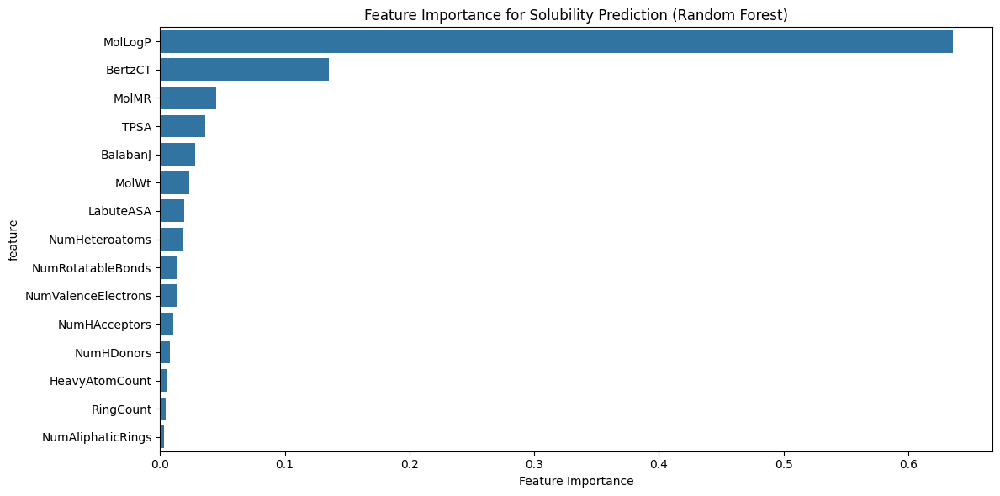

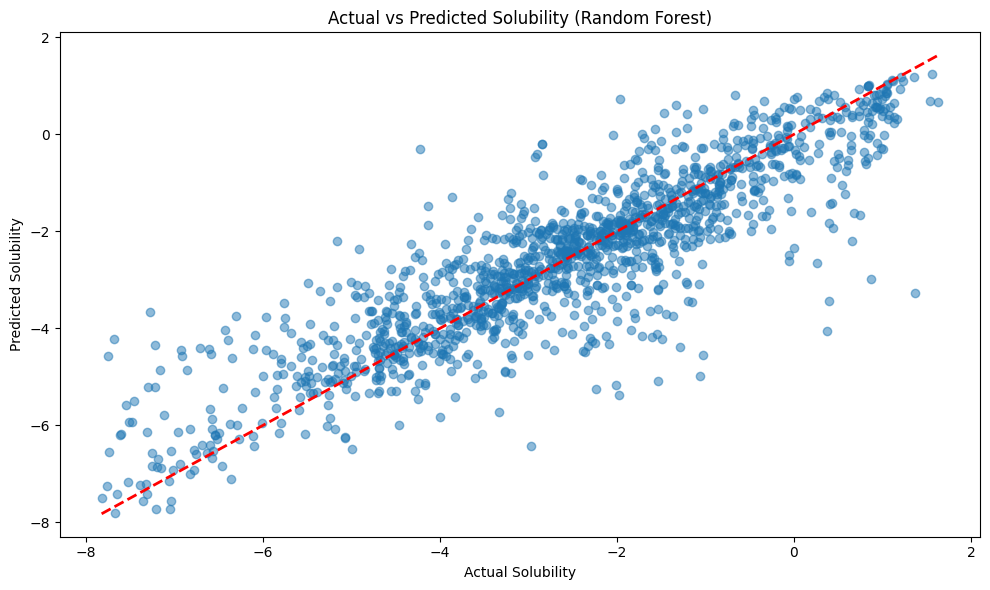


Top 5 Most Important Features:
     feature  importance
1    MolLogP    0.635661
14   BertzCT    0.135564
2      MolMR    0.044840
11      TPSA    0.036489
13  BalabanJ    0.028151


In [3]:
#Linear Regression has a better performance, update the training with linear regression
X_scaled = scaler.fit_transform(X)
lr.fit(X_scaled, y)
df_cleaned["Predicted_Solubility"] = lr.predict(X_scaled)
update_file_path = r"updated_solubility_dataset.csv"
df_cleaned.to_csv(update_file_path, index=False)
print(f"Updated dataset with predictions saved to {update_file_path}")

# Initialize and train the models
models = {
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, random_state=42),
    'Support Vector Regression': SVR(kernel='rbf')
}

results = {}

for name, model in models.items():
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    results[name] = {'MSE': mse, 'R2': r2}

# Print results to compare which perfomed the best
print("\nModel Performance Metrics:")
for name, metrics in results.items():
    print(f"{name}:")
    print(f"  Mean Squared Error: {metrics['MSE']:.4f}")
    print(f"  R-squared: {metrics['R2']:.4f}")
    print()

# Feature importance for Random Forest
rf_model = models['Random Forest']
feature_importance = pd.DataFrame({
    'feature': features, 
    'importance': rf_model.feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

# Visualizing the feature importance
plt.figure(figsize=(12, 6))
sns.barplot(x='importance', y='feature', data=feature_importance)
plt.title('Feature Importance for Solubility Prediction (Random Forest)')
plt.xlabel('Feature Importance')
plt.tight_layout()
plt.show()

# Scatter plot of predicted vs actual solubility for the best performing model
best_model_name = max(results, key=lambda x: results[x]['R2'])
best_model = models[best_model_name]
y_pred_best = best_model.predict(X_test_scaled)

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_best, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual Solubility')
plt.ylabel('Predicted Solubility')
plt.title(f'Actual vs Predicted Solubility ({best_model_name})')
plt.tight_layout()
plt.show()

# Print top 5 most important features
print("\nTop 5 Most Important Features:")
print(feature_importance.head())

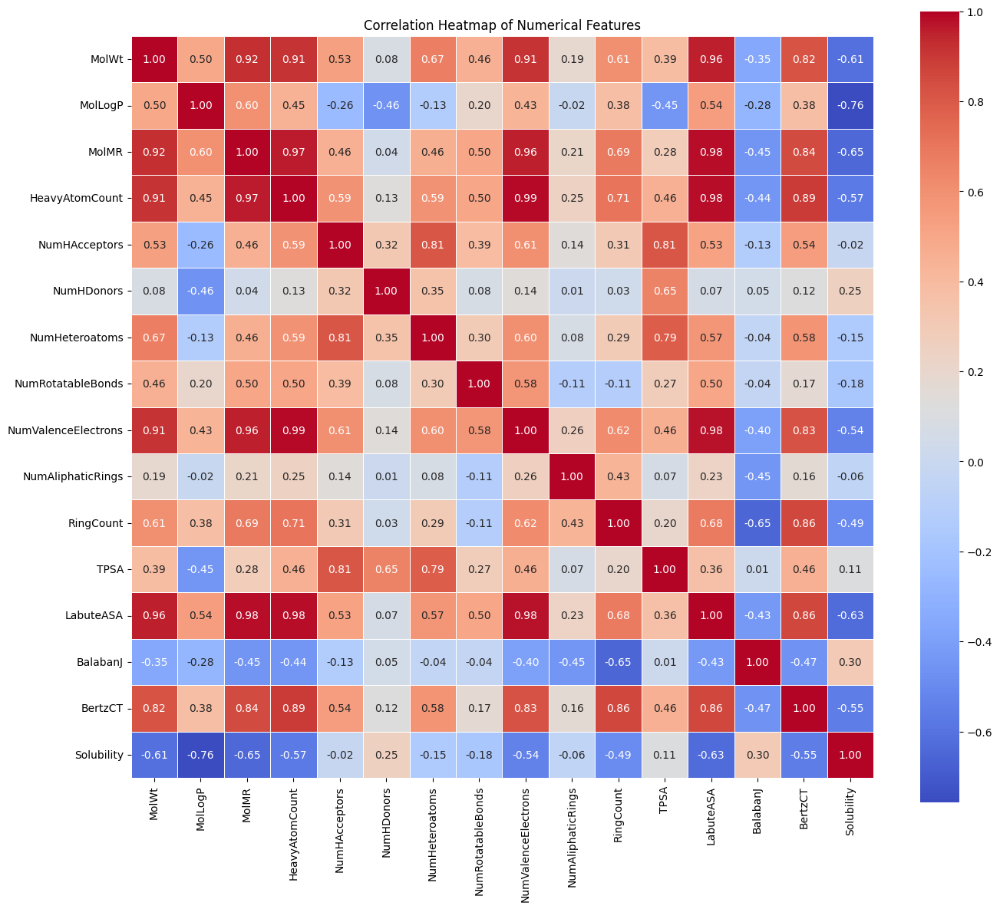

Highly correlated feature pairs (|correlation| > 0.7):
MolMR - MolWt: 0.92
HeavyAtomCount - MolWt: 0.91
HeavyAtomCount - MolMR: 0.97
NumHeteroatoms - NumHAcceptors: 0.81
NumValenceElectrons - MolWt: 0.91
NumValenceElectrons - MolMR: 0.96
NumValenceElectrons - HeavyAtomCount: 0.99
RingCount - HeavyAtomCount: 0.71
TPSA - NumHAcceptors: 0.81
TPSA - NumHeteroatoms: 0.79
LabuteASA - MolWt: 0.96
LabuteASA - MolMR: 0.98
LabuteASA - HeavyAtomCount: 0.98
LabuteASA - NumValenceElectrons: 0.98
BertzCT - MolWt: 0.82
BertzCT - MolMR: 0.84
BertzCT - HeavyAtomCount: 0.89
BertzCT - NumValenceElectrons: 0.83
BertzCT - RingCount: 0.86
BertzCT - LabuteASA: 0.86
Solubility - MolLogP: -0.76

Top 5 features most correlated with Solubility:
Solubility       1.000000
BalabanJ         0.304368
NumHDonors       0.252377
TPSA             0.113501
NumHAcceptors   -0.017803
Name: Solubility, dtype: float64

Bottom 5 features least correlated with Solubility:
HeavyAtomCount   -0.569614
MolWt            -0.607322
La

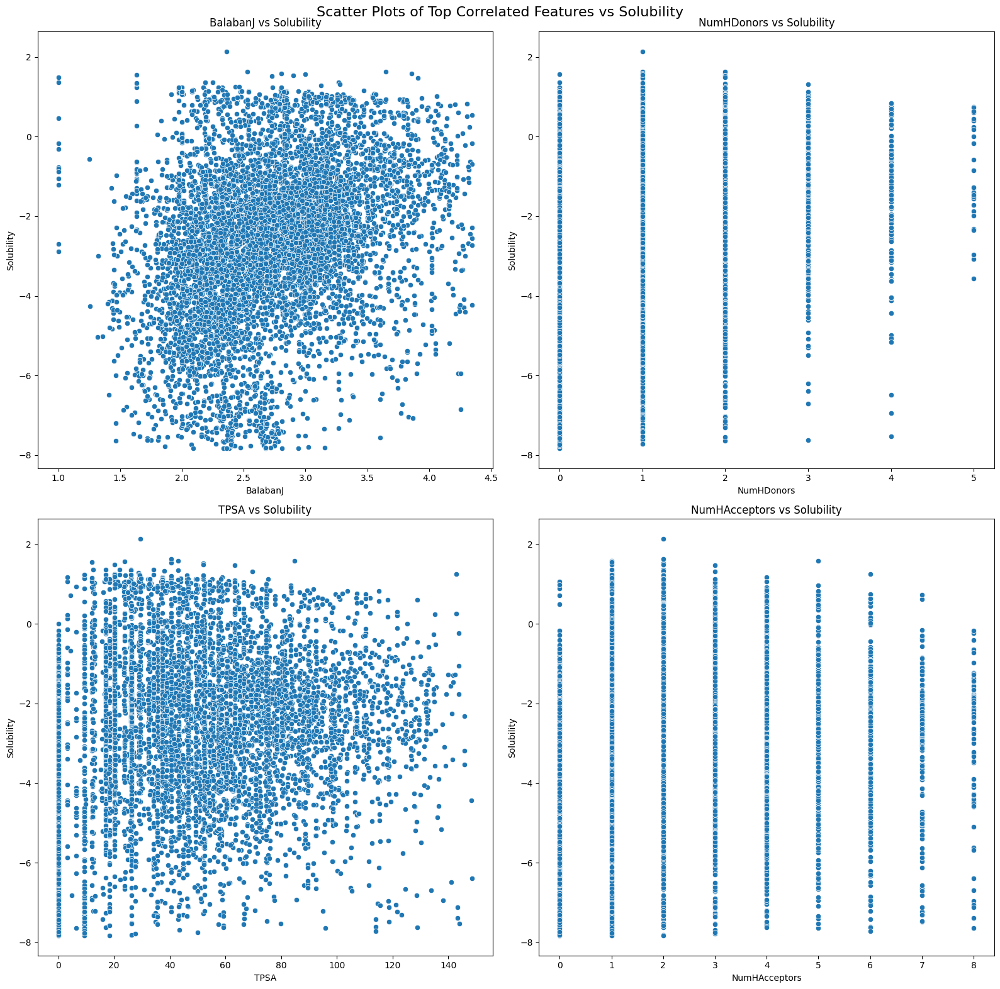

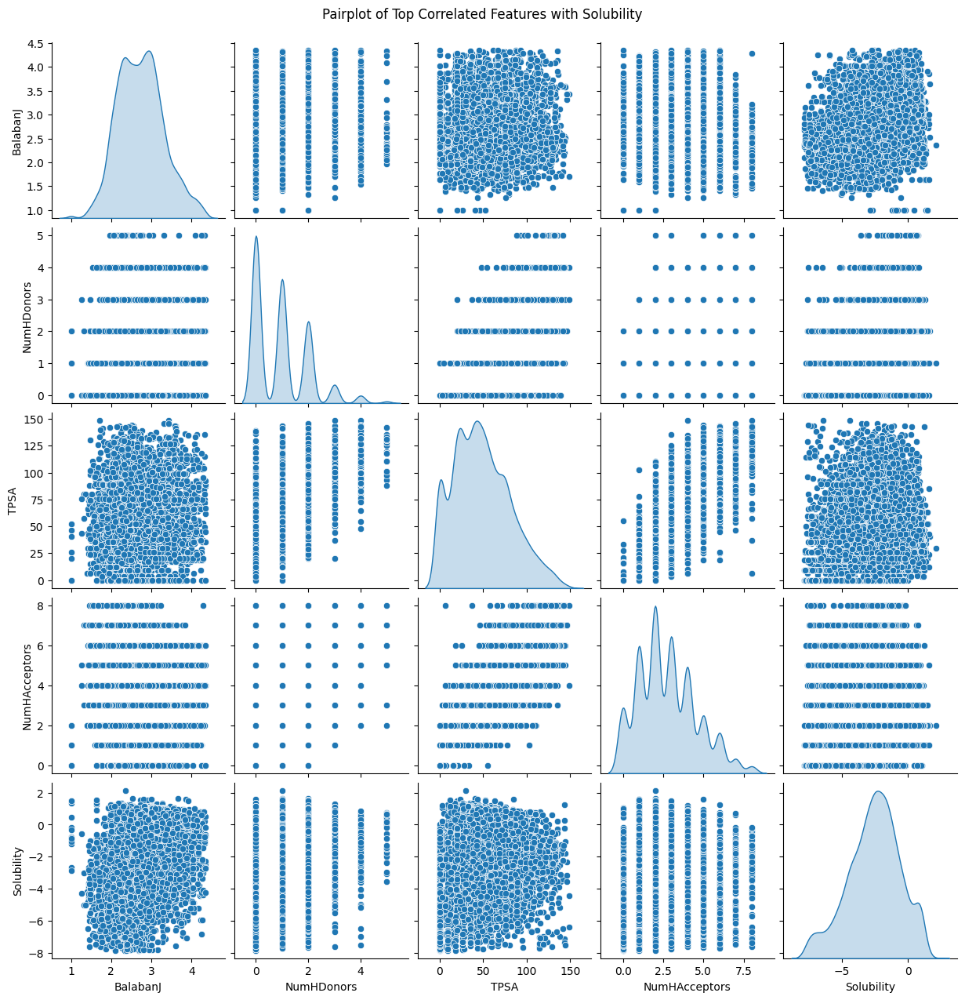

In [4]:
# Compute the correlation matrix of cleaned data
correlation_matrix = df_cleaned[numerical_features].corr()

# Plot correlation heatmap
plt.figure(figsize=(14, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f', square=True)
plt.title('Correlation Heatmap of Numerical Features')
plt.tight_layout()
plt.show()

# this function is used to get highly correlated features
def get_highly_correlated_features(corr_matrix, threshold=0.7):
    high_corr = {}
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold:
                feat_i = corr_matrix.columns[i]
                feat_j = corr_matrix.columns[j]
                high_corr[f"{feat_i} - {feat_j}"] = corr_matrix.iloc[i, j]
    return high_corr

# Get highly correlated features
high_correlations = get_highly_correlated_features(correlation_matrix)

print("Highly correlated feature pairs (|correlation| > 0.7):")
for pair, corr in high_correlations.items():
    print(f"{pair}: {corr:.2f}")

# Analyze correlations with Solubility
solubility_correlations = correlation_matrix['Solubility'].sort_values(ascending=False)

print("\nTop 5 features most correlated with Solubility:")
print(solubility_correlations.head())

print("\nBottom 5 features least correlated with Solubility:")
print(solubility_correlations.tail())

# Scatter plots for top correlated features with Solubility
top_correlated = solubility_correlations.head().index.tolist()[1:]  # Exclude Solubility itself
fig, axes = plt.subplots(2, 2, figsize=(16, 16))
fig.suptitle('Scatter Plots of Top Correlated Features vs Solubility', fontsize=16)

for i, feature in enumerate(top_correlated):
    row = i // 2
    col = i % 2
    sns.scatterplot(data=df_cleaned, x=feature, y='Solubility', ax=axes[row, col])
    axes[row, col].set_title(f'{feature} vs Solubility')
    axes[row, col].set_xlabel(feature)
    axes[row, col].set_ylabel('Solubility')

plt.tight_layout()
plt.show()

# Pairplot of top correlated features
sns.pairplot(df_cleaned[top_correlated + ['Solubility']], diag_kind='kde')
plt.suptitle('Pairplot of Top Correlated Features with Solubility', y=1.02)
plt.show()

In [5]:
# Define the common substructure (e.g., benzene ring)
substructure = Chem.MolFromSmiles('c1ccccc1')

# Function to check if a molecule contains the substructure
def has_substructure(smiles, substructure):
    mol = Chem.MolFromSmiles(smiles)
    return mol.HasSubstructMatch(substructure) if mol else False

# Filter compounds with the common substructure
df_filtered = df[df['SMILES'].apply(lambda x: has_substructure(x, substructure))]

# Calculate properties if not already present
if 'MolWt' not in df_filtered.columns:
    df_filtered['MolWt'] = df_filtered['SMILES'].apply(lambda x: Descriptors.ExactMolWt(Chem.MolFromSmiles(x)))
if 'TPSA' not in df_filtered.columns:
    df_filtered['TPSA'] = df_filtered['SMILES'].apply(lambda x: Descriptors.TPSA(Chem.MolFromSmiles(x)))

# Sort by Solubility for better visualization
df_sorted = df_filtered.sort_values('Solubility')

'''# Create the plot
fig, ax = plt.subplots(figsize=(15, 10))

# Plot Solubility vs MolWt, with color representing TPSA
scatter = ax.scatter(df_sorted['MolWt'], df_sorted['Solubility'], c=df_sorted['TPSA'], cmap='viridis', alpha=0.7)

# Add colorbar
cbar = plt.colorbar(scatter)
cbar.set_label('TPSA', rotation=270, labelpad=15)

# Set labels and title
ax.set_xlabel('Molecular Weight')
ax.set_ylabel('Solubility')
ax.set_title('2D Structure Alignment Plot: Compounds with Benzene Ring')

# Add molecule structures to the plot
for i, (idx, row) in enumerate(df_sorted.iterrows()):
    if i % 5 == 0:  # Add structure for every 5th point to avoid overcrowding
        mol = Chem.MolFromSmiles(row['SMILES'])
        img = Draw.MolToImage(mol, size=(100, 100))
        imagebox = OffsetImage(img, zoom=0.2)
        ab = AnnotationBbox(imagebox, (row['MolWt'], row['Solubility']), box_alignment=(1.1, 0.5), frameon=False)
        ax.add_artist(ab)

plt.tight_layout()
plt.show()'''

# Print some statistics
print(f"Total compounds: {len(df)}")
print(f"Compounds with benzene ring: {len(df_filtered)}")
print(f"Top 5 most soluble compounds with benzene ring:")
print(df_filtered.nlargest(5, 'Solubility')[['Name', 'Solubility', 'MolWt', 'TPSA']])

[21:14:36] WARNING: not removing hydrogen atom without neighbors
[21:14:36] WARNING: not removing hydrogen atom without neighbors
[21:14:36] WARNING: not removing hydrogen atom without neighbors
[21:14:36] WARNING: not removing hydrogen atom without neighbors
[21:14:36] WARNING: not removing hydrogen atom without neighbors
[21:14:36] WARNING: not removing hydrogen atom without neighbors
[21:14:36] WARNING: not removing hydrogen atom without neighbors
[21:14:36] WARNING: not removing hydrogen atom without neighbors
[21:14:36] WARNING: not removing hydrogen atom without neighbors
[21:14:36] WARNING: not removing hydrogen atom without neighbors
[21:14:36] WARNING: not removing hydrogen atom without neighbors
[21:14:36] WARNING: not removing hydrogen atom without neighbors
[21:14:36] WARNING: not removing hydrogen atom without neighbors
[21:14:36] WARNING: not removing hydrogen atom without neighbors
[21:14:36] WARNING: not removing hydrogen atom without neighbors
[21:14:36] WARNING: not r

Total compounds: 9982
Compounds with benzene ring: 5069
Top 5 most soluble compounds with benzene ring:
                                    Name  Solubility    MolWt    TPSA
3826    1,8-anthraquinonedisulfonic acid    1.257200  368.344  142.88
3189  [4-(aminomethyl)phenyl]methanamine    1.175072  136.198   52.04
2652                    benzene-1,3-diol    1.003488  110.112   40.46
3947                 n-methylbenzylamine    0.916600  121.183   12.03
1846     ethyl N-ethyl-N-phenylcarbamate    0.867399  193.246   29.54


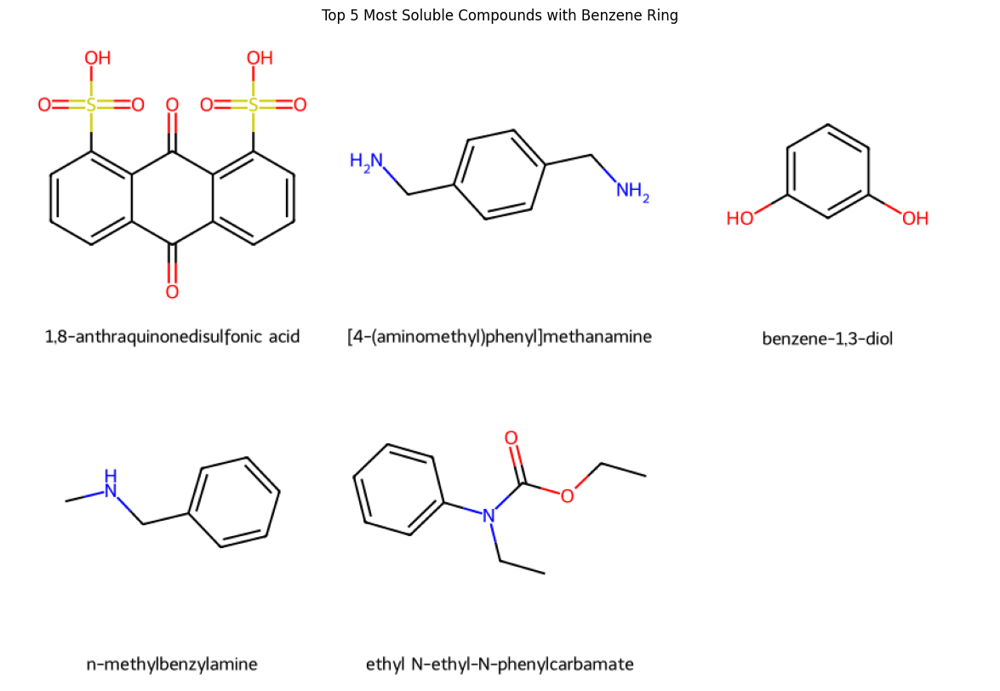

                                 Name  Solubility    MolWt    TPSA
0    1,8-anthraquinonedisulfonic acid    1.257200  368.344  142.88
1  [4-(aminomethyl)phenyl]methanamine    1.175072  136.198   52.04
2                    benzene-1,3-diol    1.003488  110.112   40.46
3                 n-methylbenzylamine    0.916600  121.183   12.03
4     ethyl N-ethyl-N-phenylcarbamate    0.867399  193.246   29.54


In [6]:


# Create a DataFrame with the given information
data = {
    'Name': [
        '1,8-anthraquinonedisulfonic acid',
        '[4-(aminomethyl)phenyl]methanamine',
        'benzene-1,3-diol',
        'n-methylbenzylamine',
        'ethyl N-ethyl-N-phenylcarbamate'
    ],
    'Solubility': [1.257200, 1.175072, 1.003488, 0.916600, 0.867399],
    'MolWt': [368.344, 136.198, 110.112, 121.183, 193.246],
    'TPSA': [142.88, 52.04, 40.46, 12.03, 29.54],
    'SMILES': [
        'O=C1c2cccc(S(=O)(=O)O)c2C(=O)c2c(S(=O)(=O)O)cccc21',
        'NCc1ccc(CN)cc1',
        'Oc1cccc(O)c1',
        'CNCc1ccccc1',
        'CCN(c1ccccc1)C(=O)OCC'
    ]
}

df = pd.DataFrame(data)

# Create molecules from SMILES
mols = [Chem.MolFromSmiles(smiles) for smiles in df['SMILES']]

# Generate 2D depictions, explicitly set returnPNG to False
img = Draw.MolsToGridImage(mols, molsPerRow=3, subImgSize=(300,300), legends=list(df['Name']), returnPNG=False)

# Convert PIL Image to a format matplotlib can display
img_data = io.BytesIO()
img.save(img_data, format='PNG')
img_data.seek(0)
img_array = plt.imread(img_data)

# Display the image
plt.figure(figsize=(15,10))
plt.imshow(img_array)
plt.axis('off')
plt.title("Top 5 Most Soluble Compounds with Benzene Ring")
plt.show()

# Print information about these compounds
print(df[['Name', 'Solubility', 'MolWt', 'TPSA']])

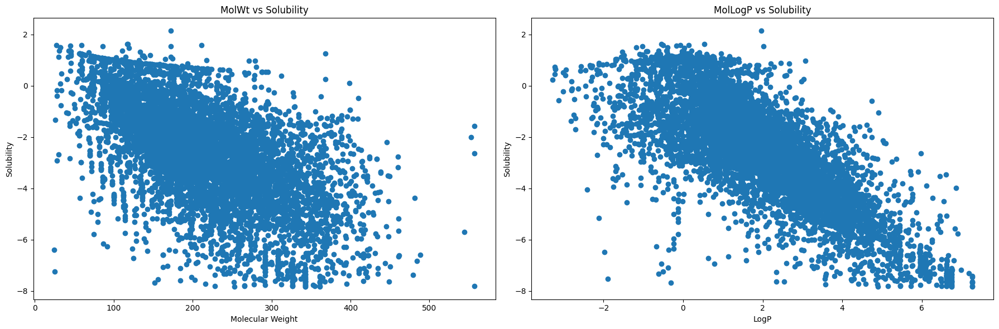

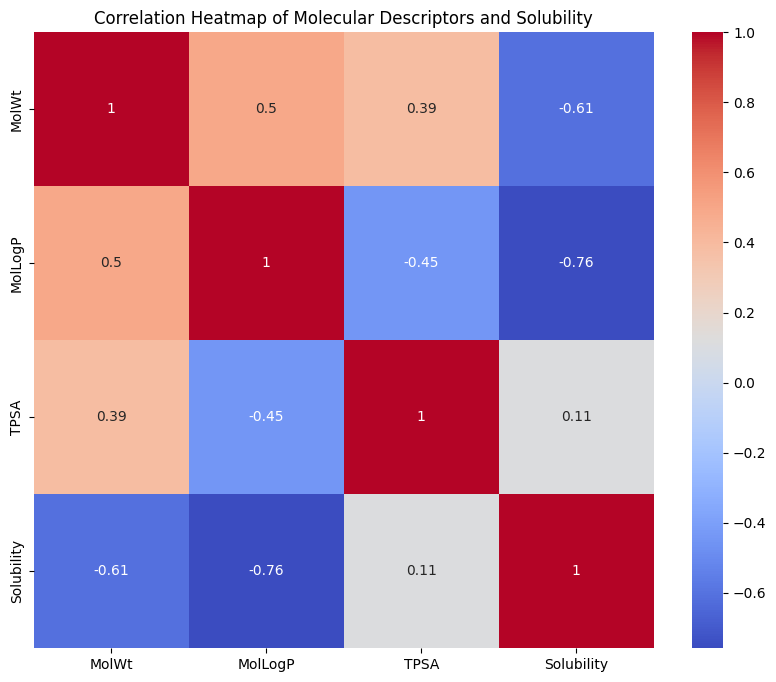

In [8]:
# Load the dataset
df = pd.read_csv("cleaned_solubility_dataset.csv")

# Create scatter plots
fig, axs = plt.subplots(1, 2, figsize=(18, 6))

# MolWt vs Solubility
axs[0].scatter(df['MolWt'], df['Solubility'])
axs[0].set_xlabel('Molecular Weight')
axs[0].set_ylabel('Solubility')
axs[0].set_title('MolWt vs Solubility')

# MolLogP vs Solubility
axs[1].scatter(df['MolLogP'], df['Solubility'])
axs[1].set_xlabel('LogP')
axs[1].set_ylabel('Solubility')
axs[1].set_title('MolLogP vs Solubility')

plt.tight_layout()
plt.show()

# Create a heatmap
correlation_matrix = df[['MolWt', 'MolLogP', 'TPSA', 'Solubility']].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap of Molecular Descriptors and Solubility')
plt.show()

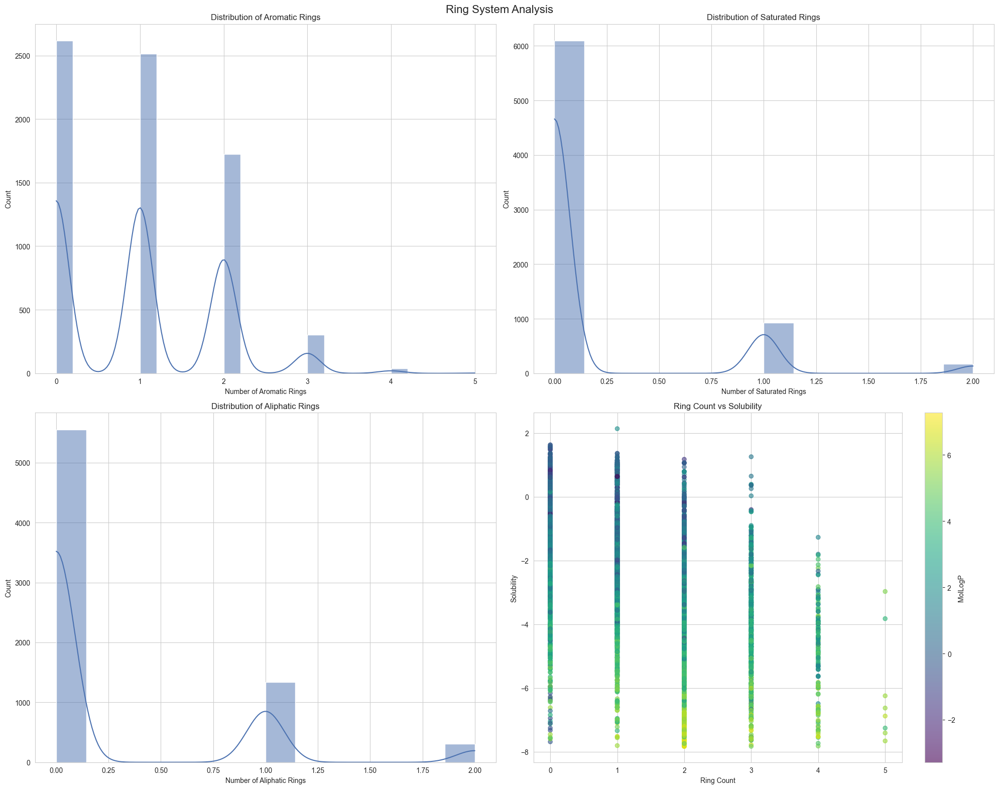

Summary Statistics for Ring Types:
       NumAromaticRings  NumSaturatedRings  NumAliphaticRings    RingCount
count       7201.000000        7201.000000        7201.000000  7201.000000
mean           0.978197           0.177198           0.270935     1.249132
std            0.909638           0.440627           0.531299     1.004508
min            0.000000           0.000000           0.000000     0.000000
25%            0.000000           0.000000           0.000000     0.000000
50%            1.000000           0.000000           0.000000     1.000000
75%            2.000000           0.000000           0.000000     2.000000
max            5.000000           2.000000           2.000000     5.000000

Correlations with Solubility:
Solubility           1.000000
NumSaturatedRings    0.025183
NumAliphaticRings   -0.056789
RingCount           -0.494815
NumAromaticRings    -0.513252
Name: Solubility, dtype: float64

Correlations with MolLogP:
MolLogP              1.000000
NumAromaticRings  

In [10]:
# Set up the plotting style
sns.set_style('whitegrid')
sns.set_palette("deep")

# Create a figure with subplots for ring type distributions
fig, axs = plt.subplots(2, 2, figsize=(20, 16))
fig.suptitle("Ring System Analysis", fontsize=16)

# 1. Distribution of Aromatic Rings
sns.histplot(df['NumAromaticRings'], kde=True, ax=axs[0, 0])
axs[0, 0].set_title('Distribution of Aromatic Rings')
axs[0, 0].set_xlabel('Number of Aromatic Rings')
axs[0, 0].set_ylabel('Count')

# 2. Distribution of Saturated Rings
sns.histplot(df['NumSaturatedRings'], kde=True, ax=axs[0, 1])
axs[0, 1].set_title('Distribution of Saturated Rings')
axs[0, 1].set_xlabel('Number of Saturated Rings')
axs[0, 1].set_ylabel('Count')

# 3. Distribution of Aliphatic Rings
sns.histplot(df['NumAliphaticRings'], kde=True, ax=axs[1, 0])
axs[1, 0].set_title('Distribution of Aliphatic Rings')
axs[1, 0].set_xlabel('Number of Aliphatic Rings')
axs[1, 0].set_ylabel('Count')

# 4. Scatter plot of RingCount vs Solubility
scatter = axs[1, 1].scatter(df['RingCount'], df['Solubility'], c=df['MolLogP'], cmap='viridis', alpha=0.6)
axs[1, 1].set_title('Ring Count vs Solubility')
axs[1, 1].set_xlabel('Ring Count')
axs[1, 1].set_ylabel('Solubility')
plt.colorbar(scatter, ax=axs[1, 1], label='MolLogP')

plt.tight_layout()
plt.show()

# Print summary statistics for ring types
print("Summary Statistics for Ring Types:")
print(df[['NumAromaticRings', 'NumSaturatedRings', 'NumAliphaticRings', 'RingCount']].describe())

# Calculate and print correlations with Solubility and MolLogP
print("\nCorrelations with Solubility:")
correlations_solubility = df[['RingCount', 'NumAromaticRings', 'NumSaturatedRings', 'NumAliphaticRings', 'Solubility']].corr()['Solubility'].sort_values(ascending=False)
print(correlations_solubility)

print("\nCorrelations with MolLogP:")
correlations_mollogp = df[['RingCount', 'NumAromaticRings', 'NumSaturatedRings', 'NumAliphaticRings', 'MolLogP']].corr()['MolLogP'].sort_values(ascending=False)
print(correlations_mollogp)

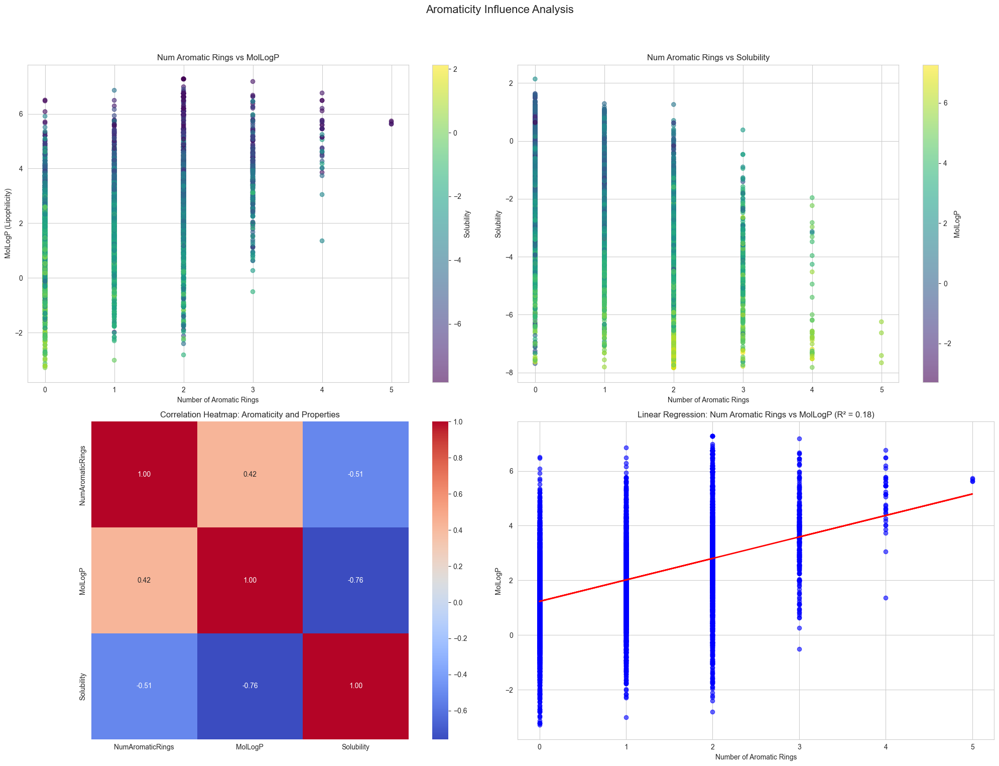

Summary Statistics for Aromaticity Descriptors:
       NumAromaticRings      MolLogP   Solubility
count       7201.000000  7201.000000  7201.000000
mean           0.978197     1.997229    -2.573220
std            0.909638     1.688544     1.957106
min            0.000000    -3.284900    -7.830600
25%            0.000000     0.882600    -3.812100
50%            1.000000     1.912100    -2.436881
75%            2.000000     3.035100    -1.240000
max            5.000000     7.274000     2.137682

Correlations with Solubility:
Solubility          1.000000
NumAromaticRings   -0.513252
Name: Solubility, dtype: float64

Correlations with MolLogP:
MolLogP             1.000000
NumAromaticRings    0.423306
Name: MolLogP, dtype: float64


In [11]:
# Set up the plotting style
sns.set_style('whitegrid')
sns.set_palette("deep")

# Create a figure with subplots for aromaticity analysis
fig, axs = plt.subplots(2, 2, figsize=(20, 16))
fig.suptitle("Aromaticity Influence Analysis", fontsize=16)

# 1. Scatter plot of NumAromaticRings vs MolLogP
scatter1 = axs[0, 0].scatter(df['NumAromaticRings'], df['MolLogP'], c=df['Solubility'], cmap='viridis', alpha=0.6)
axs[0, 0].set_title('Num Aromatic Rings vs MolLogP')
axs[0, 0].set_xlabel('Number of Aromatic Rings')
axs[0, 0].set_ylabel('MolLogP (Lipophilicity)')
plt.colorbar(scatter1, ax=axs[0, 0], label='Solubility')

# 2. Scatter plot of NumAromaticRings vs Solubility
scatter2 = axs[0, 1].scatter(df['NumAromaticRings'], df['Solubility'], c=df['MolLogP'], cmap='viridis', alpha=0.6)
axs[0, 1].set_title('Num Aromatic Rings vs Solubility')
axs[0, 1].set_xlabel('Number of Aromatic Rings')
axs[0, 1].set_ylabel('Solubility')
plt.colorbar(scatter2, ax=axs[0, 1], label='MolLogP')

# 3. Correlation heatmap for aromaticity and properties
aromaticity_descriptors = ['NumAromaticRings', 'MolLogP', 'Solubility']
correlation_matrix = df[aromaticity_descriptors].corr()
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', ax=axs[1, 0], square=True)
axs[1, 0].set_title('Correlation Heatmap: Aromaticity and Properties')

# 4. Linear regression to explore relationship between NumAromaticRings and MolLogP
X_mollogp = df[['NumAromaticRings']].dropna()
y_mollogp = df['MolLogP'].loc[X_mollogp.index]  # Ensure y matches X's index

model_mollogp = LinearRegression()
model_mollogp.fit(X_mollogp, y_mollogp)

y_pred_mollogp = model_mollogp.predict(X_mollogp)
r_squared_mollogp = r2_score(y_mollogp, y_pred_mollogp)

# Plot linear regression results for MolLogP
axs[1, 1].scatter(X_mollogp, y_mollogp, color='blue', alpha=0.6)
axs[1, 1].plot(X_mollogp, y_pred_mollogp, color='red', linewidth=2)
axs[1, 1].set_title(f'Linear Regression: Num Aromatic Rings vs MolLogP (R² = {r_squared_mollogp:.2f})')
axs[1, 1].set_xlabel('Number of Aromatic Rings')
axs[1, 1].set_ylabel('MolLogP')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# Print summary statistics for aromaticity descriptors
print("Summary Statistics for Aromaticity Descriptors:")
print(df[aromaticity_descriptors].describe())

# Calculate and print correlations with Solubility and MolLogP
print("\nCorrelations with Solubility:")
correlations_solubility = df[['NumAromaticRings', 'Solubility']].corr()['Solubility'].sort_values(ascending=False)
print(correlations_solubility)

print("\nCorrelations with MolLogP:")
correlations_mollogp = df[['NumAromaticRings', 'MolLogP']].corr()['MolLogP'].sort_values(ascending=False)
print(correlations_mollogp)

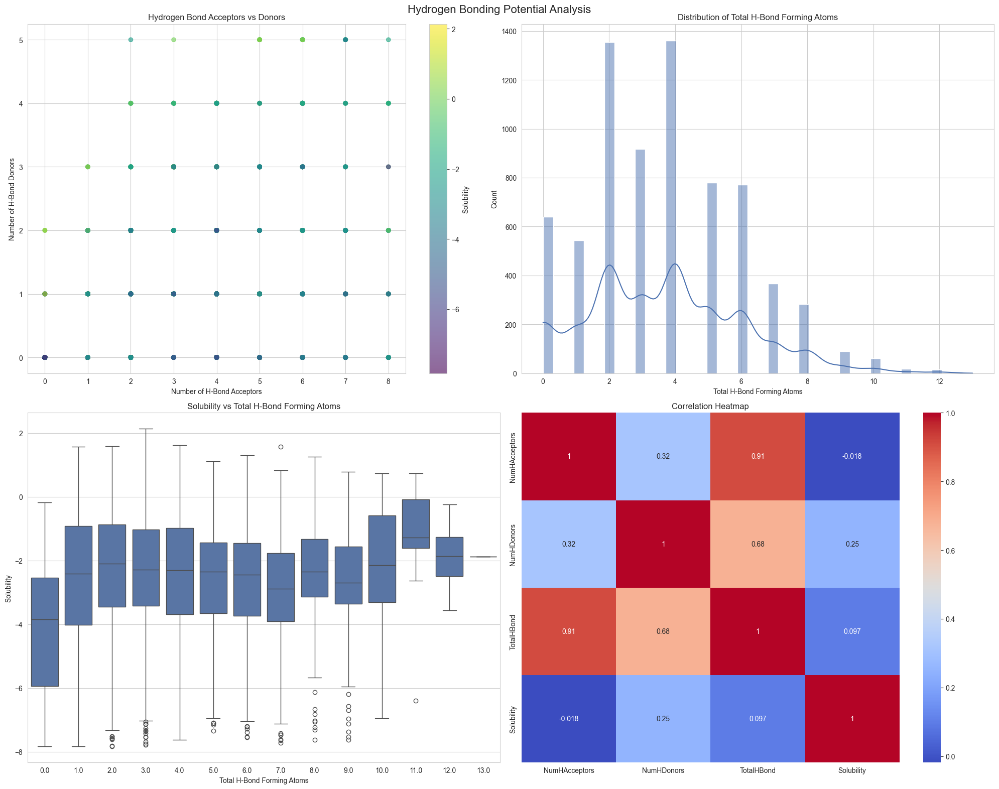

Summary Statistics:
       NumHAcceptors   NumHDonors   TotalHBond   Solubility
count    7201.000000  7201.000000  7201.000000  7201.000000
mean        2.745869     0.952229     3.698097    -2.573220
std         1.793078     1.020319     2.325692     1.957106
min         0.000000     0.000000     0.000000    -7.830600
25%         1.000000     0.000000     2.000000    -3.812100
50%         3.000000     1.000000     4.000000    -2.436881
75%         4.000000     2.000000     5.000000    -1.240000
max         8.000000     5.000000    13.000000     2.137682

Correlations with Solubility:
Solubility       1.000000
NumHDonors       0.252377
TotalHBond       0.096996
NumHAcceptors   -0.017803
Name: Solubility, dtype: float64

Linear Regression Results:
R-squared: 0.0094
Coefficient: 0.0816
Intercept: -2.8751


In [12]:
# Set up the plotting style
sns.set_style('whitegrid')
sns.set_palette("deep")

# Create a figure with subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 16))
fig.suptitle("Hydrogen Bonding Potential Analysis", fontsize=16)

# 1. Scatter plot of NumHAcceptors vs NumHDonors
scatter = axs[0, 0].scatter(df['NumHAcceptors'], df['NumHDonors'], c=df['Solubility'], cmap='viridis', alpha=0.6)
axs[0, 0].set_title('Hydrogen Bond Acceptors vs Donors')
axs[0, 0].set_xlabel('Number of H-Bond Acceptors')
axs[0, 0].set_ylabel('Number of H-Bond Donors')
plt.colorbar(scatter, ax=axs[0, 0], label='Solubility')

# 2. Distribution of Total H-Bond Forming Atoms
df['TotalHBond'] = df['NumHAcceptors'] + df['NumHDonors']
sns.histplot(df['TotalHBond'], kde=True, ax=axs[0, 1])
axs[0, 1].set_title('Distribution of Total H-Bond Forming Atoms')
axs[0, 1].set_xlabel('Total H-Bond Forming Atoms')
axs[0, 1].set_ylabel('Count')

# 3. Boxplot of Solubility vs Total H-Bond Forming Atoms
sns.boxplot(x='TotalHBond', y='Solubility', data=df, ax=axs[1, 0])
axs[1, 0].set_title('Solubility vs Total H-Bond Forming Atoms')
axs[1, 0].set_xlabel('Total H-Bond Forming Atoms')
axs[1, 0].set_ylabel('Solubility')
# Set x-ticks to integers only
max_hbond = int(df['TotalHBond'].max())
axs[1, 0].set_xticks(range(0, max_hbond + 1, max(1, max_hbond // 10)))

# 4. Heatmap of correlations
corr_matrix = df[['NumHAcceptors', 'NumHDonors', 'TotalHBond', 'Solubility']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', ax=axs[1, 1])
axs[1, 1].set_title('Correlation Heatmap')

plt.tight_layout()
plt.show()

# Print summary statistics
print("Summary Statistics:")
print(df[['NumHAcceptors', 'NumHDonors', 'TotalHBond', 'Solubility']].describe())

# Calculate and print correlations
print("\nCorrelations with Solubility:")
correlations = df[['NumHAcceptors', 'NumHDonors', 'TotalHBond', 'Solubility']].corr()['Solubility'].sort_values(ascending=False)
print(correlations)

# Perform a simple linear regression
X = df[['TotalHBond']]
y = df['Solubility']

model = LinearRegression()
model.fit(X, y)

print("\nLinear Regression Results:")
print(f"R-squared: {r2_score(y, model.predict(X)):.4f}")
print(f"Coefficient: {model.coef_[0]:.4f}")
print(f"Intercept: {model.intercept_:.4f}")

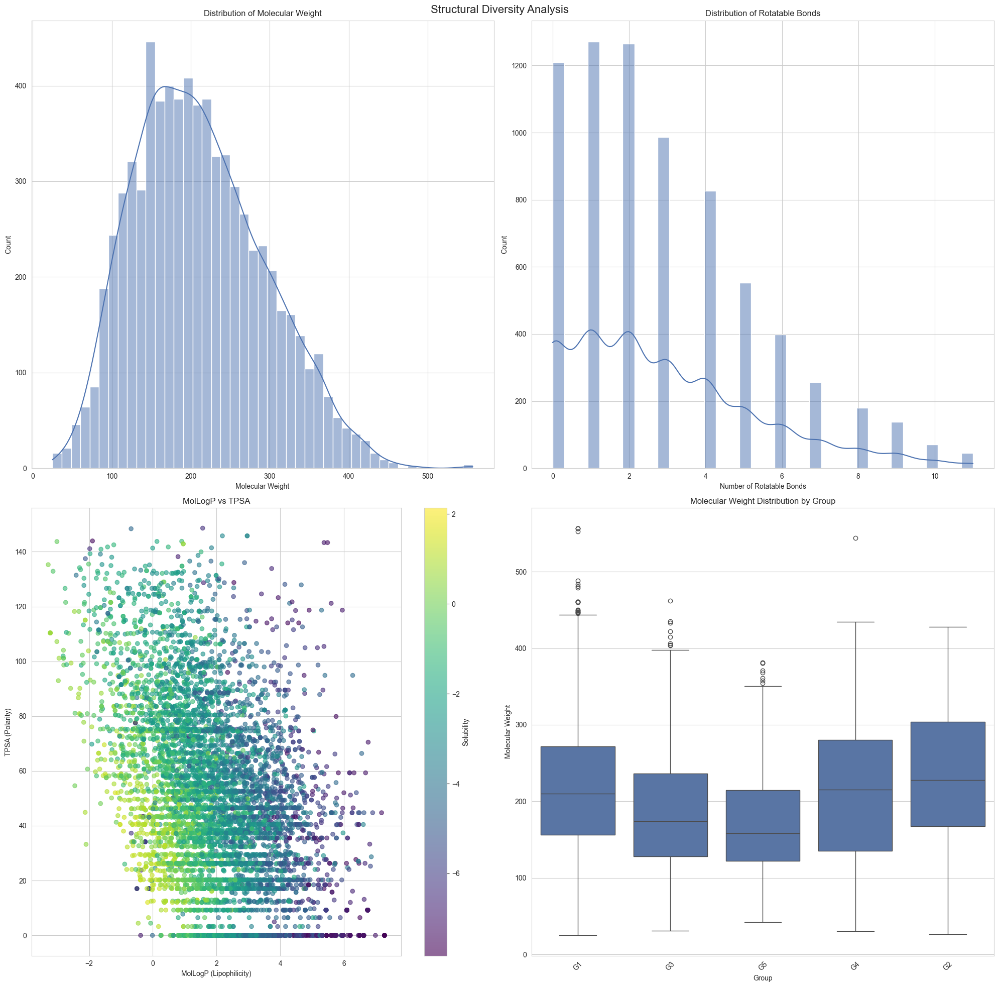

Summary Statistics:
             MolWt  NumRotatableBonds      MolLogP         TPSA
count  7201.000000        7201.000000  7201.000000  7201.000000
mean    211.060009           2.902930     1.997229    48.638214
std      82.043025           2.464277     1.688544    32.279286
min      24.819000           0.000000    -3.284900     0.000000
25%     150.155000           1.000000     0.882600    23.790000
50%     202.250000           2.000000     1.912100    46.170000
75%     265.954000           4.000000     3.035100    71.080000
max     556.863000          11.000000     7.274000   148.610000

Correlations with Solubility:
Solubility           1.000000
TPSA                 0.113501
NumRotatableBonds   -0.179506
MolWt               -0.607322
MolLogP             -0.758371
Name: Solubility, dtype: float64


In [13]:
# Set up the plotting style using Seaborn
sns.set_style('whitegrid')
sns.set_palette("deep")

# Create a figure with subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
fig.suptitle("Structural Diversity Analysis", fontsize=16)

# 1. Distribution of Molecular Weight
sns.histplot(df['MolWt'], kde=True, ax=axs[0, 0])
axs[0, 0].set_title('Distribution of Molecular Weight')
axs[0, 0].set_xlabel('Molecular Weight')
axs[0, 0].set_ylabel('Count')

# 2. Distribution of Rotatable Bonds
sns.histplot(df['NumRotatableBonds'], kde=True, ax=axs[0, 1])
axs[0, 1].set_title('Distribution of Rotatable Bonds')
axs[0, 1].set_xlabel('Number of Rotatable Bonds')
axs[0, 1].set_ylabel('Count')

# 3. Scatter plot of MolLogP vs TPSA
scatter = axs[1, 0].scatter(df['MolLogP'], df['TPSA'], c=df['Solubility'], cmap='viridis', alpha=0.6)
axs[1, 0].set_title('MolLogP vs TPSA')
axs[1, 0].set_xlabel('MolLogP (Lipophilicity)')
axs[1, 0].set_ylabel('TPSA (Polarity)')
plt.colorbar(scatter, ax=axs[1, 0], label='Solubility')

# 4. Box plot of MolWt by Group
sns.boxplot(x='Group', y='MolWt', data=df, ax=axs[1, 1])
axs[1, 1].set_title('Molecular Weight Distribution by Group')
axs[1, 1].set_xlabel('Group')
axs[1, 1].set_ylabel('Molecular Weight')
axs[1, 1].tick_params(axis='x', rotation=45)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

# Print summary statistics
print("Summary Statistics:")
print(df[['MolWt', 'NumRotatableBonds', 'MolLogP', 'TPSA']].describe())

# Calculate and print correlations
print("\nCorrelations with Solubility:")
correlations = df[['MolWt', 'NumRotatableBonds', 'MolLogP', 'TPSA', 'Solubility']].corr()['Solubility'].sort_values(ascending=False)
print(correlations)

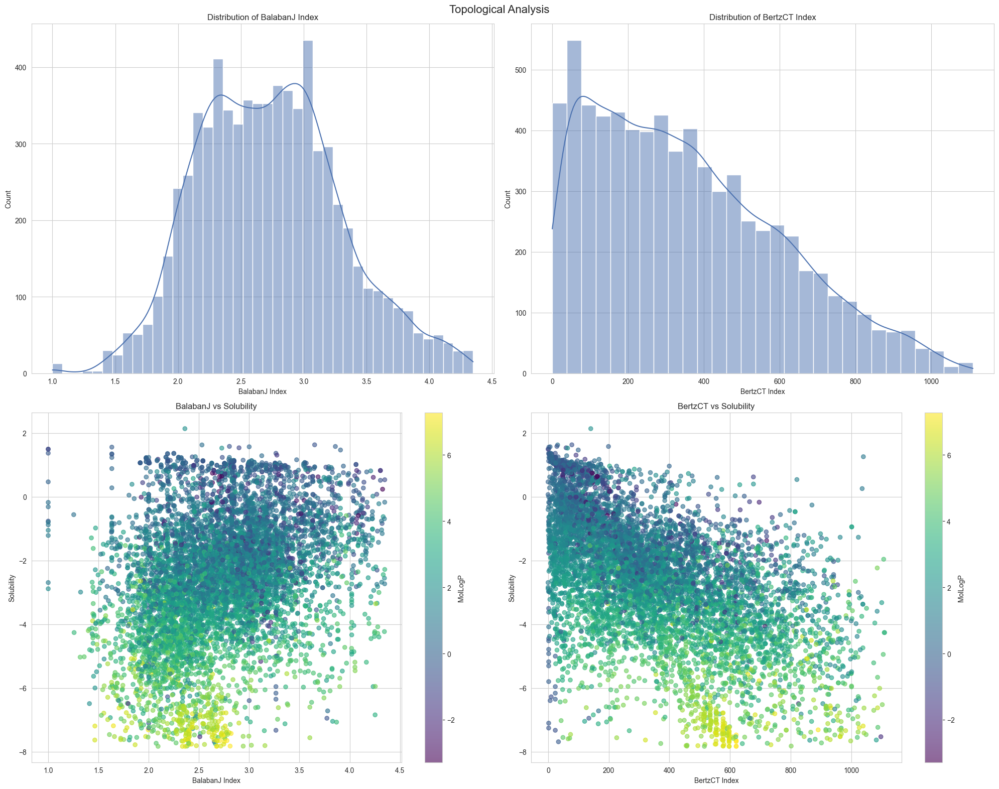

Summary Statistics for Topological Indices:
          BalabanJ      BertzCT
count  7201.000000  7201.000000
mean      2.729396   354.550226
std       0.568810   248.095101
min       1.000000     0.000000
25%       2.304477   147.388339
50%       2.710745   314.187091
75%       3.092076   523.042012
max       4.348946  1109.881632

Correlations with Solubility:
Solubility    1.000000
BalabanJ      0.304435
BertzCT      -0.553569
Name: Solubility, dtype: float64

Correlations with MolLogP:
MolLogP     1.000000
BertzCT     0.378487
BalabanJ   -0.278432
Name: MolLogP, dtype: float64


In [15]:
from rdkit.Chem import GraphDescriptors

# Calculate BalabanJ and BertzCT indices for each molecule
def calculate_topological_indices(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is not None:
        balaban_j = GraphDescriptors.BalabanJ(mol)
        bertz_ct = GraphDescriptors.BertzCT(mol)
        return pd.Series([balaban_j, bertz_ct])
    else:
        return pd.Series([None, None])

# Apply the function to calculate indices
df[['BalabanJ', 'BertzCT']] = df['SMILES'].apply(calculate_topological_indices)

# Set up the plotting style
sns.set_style('whitegrid')
sns.set_palette("deep")

# Create a figure with subplots for topological indices analysis
fig, axs = plt.subplots(2, 2, figsize=(20, 16))
fig.suptitle("Topological Analysis", fontsize=16)

# 1. Distribution of BalabanJ index
sns.histplot(df['BalabanJ'], kde=True, ax=axs[0, 0])
axs[0, 0].set_title('Distribution of BalabanJ Index')
axs[0, 0].set_xlabel('BalabanJ Index')
axs[0, 0].set_ylabel('Count')

# 2. Distribution of BertzCT index
sns.histplot(df['BertzCT'], kde=True, ax=axs[0, 1])
axs[0, 1].set_title('Distribution of BertzCT Index')
axs[0, 1].set_xlabel('BertzCT Index')
axs[0, 1].set_ylabel('Count')

# 3. Scatter plot of BalabanJ vs Solubility
scatter = axs[1, 0].scatter(df['BalabanJ'], df['Solubility'], c=df['MolLogP'], cmap='viridis', alpha=0.6)
axs[1, 0].set_title('BalabanJ vs Solubility')
axs[1, 0].set_xlabel('BalabanJ Index')
axs[1, 0].set_ylabel('Solubility')
plt.colorbar(scatter, ax=axs[1, 0], label='MolLogP')

# 4. Scatter plot of BertzCT vs Solubility
scatter = axs[1, 1].scatter(df['BertzCT'], df['Solubility'], c=df['MolLogP'], cmap='viridis', alpha=0.6)
axs[1, 1].set_title('BertzCT vs Solubility')
axs[1, 1].set_xlabel('BertzCT Index')
axs[1, 1].set_ylabel('Solubility')
plt.colorbar(scatter, ax=axs[1, 1], label='MolLogP')

plt.tight_layout()
plt.show()

# Print summary statistics for topological indices
print("Summary Statistics for Topological Indices:")
print(df[['BalabanJ', 'BertzCT']].describe())

# Calculate and print correlations with Solubility and MolLogP
print("\nCorrelations with Solubility:")
correlations_solubility = df[['BalabanJ', 'BertzCT', 'Solubility']].corr()['Solubility'].sort_values(ascending=False)
print(correlations_solubility)

print("\nCorrelations with MolLogP:")
correlations_mollogp = df[['BalabanJ', 'BertzCT', 'MolLogP']].corr()['MolLogP'].sort_values(ascending=False)
print(correlations_mollogp)

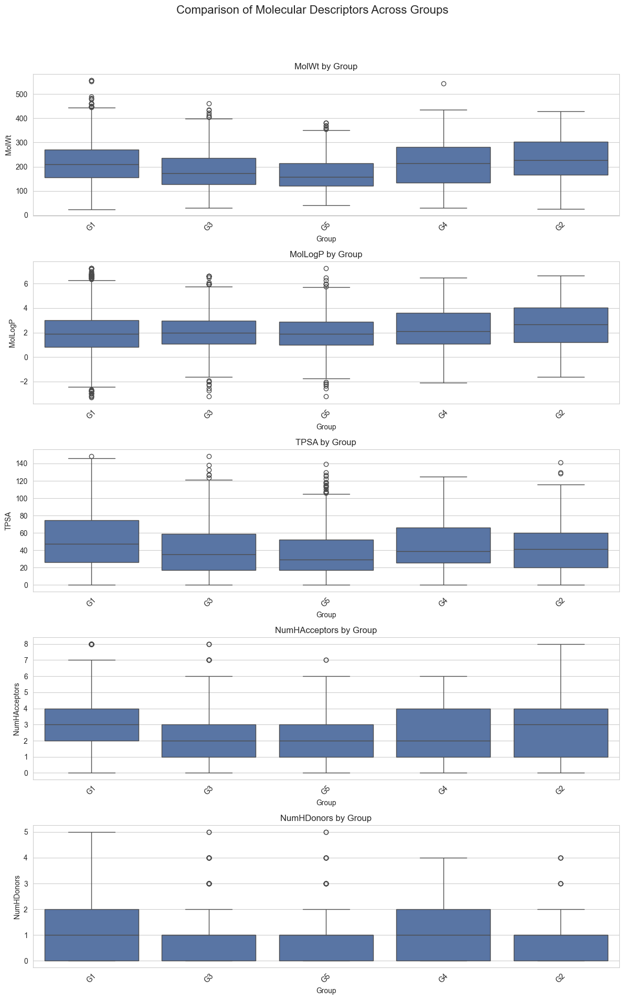

Statistical Test Results (ANOVA):
MolWt: F-statistic = 58.1912, p-value = 0.0000
MolLogP: F-statistic = 7.9406, p-value = 0.0000
TPSA: F-statistic = 49.9679, p-value = 0.0000
NumHAcceptors: F-statistic = 58.1563, p-value = 0.0000
NumHDonors: F-statistic = 9.8556, p-value = 0.0000
Significant differences found in MolWt across groups (p < 0.05).
Significant differences found in MolLogP across groups (p < 0.05).
Significant differences found in TPSA across groups (p < 0.05).
Significant differences found in NumHAcceptors across groups (p < 0.05).
Significant differences found in NumHDonors across groups (p < 0.05).


In [17]:
from scipy import stats

# Set up the plotting style
sns.set_style('whitegrid')
sns.set_palette("deep")

# List of molecular descriptors to analyze
descriptors = ['MolWt', 'MolLogP', 'TPSA', 'NumHAcceptors', 'NumHDonors']

# Create a figure for boxplots of each descriptor by Group
fig, axs = plt.subplots(len(descriptors), 1, figsize=(12, 4 * len(descriptors)))
fig.suptitle("Comparison of Molecular Descriptors Across Groups", fontsize=16)

for i, descriptor in enumerate(descriptors):
    sns.boxplot(x='Group', y=descriptor, data=df, ax=axs[i])
    axs[i].set_title(f'{descriptor} by Group')
    axs[i].set_xlabel('Group')
    axs[i].set_ylabel(descriptor)
    axs[i].tick_params(axis='x', rotation=45)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# Perform statistical tests (ANOVA) to determine significant differences between groups
results = {}
for descriptor in descriptors:
    # Grouping data by 'Group'
    groups = [group[descriptor].dropna() for name, group in df.groupby('Group')]
    
    # Perform ANOVA test
    f_statistic, p_value = stats.f_oneway(*groups)
    results[descriptor] = {'F-statistic': f_statistic, 'p-value': p_value}

# Print results of statistical tests
print("Statistical Test Results (ANOVA):")
for descriptor, result in results.items():
    print(f"{descriptor}: F-statistic = {result['F-statistic']:.4f}, p-value = {result['p-value']:.4f}")

# Interpret results
alpha = 0.05  # significance level
for descriptor, result in results.items():
    if result['p-value'] < alpha:
        print(f"Significant differences found in {descriptor} across groups (p < {alpha}).")
    else:
        print(f"No significant differences found in {descriptor} across groups (p >= {alpha}).")

Non-numeric columns: Index(['ID', 'Name', 'InChI', 'InChIKey', 'SMILES', 'Group'], dtype='object')


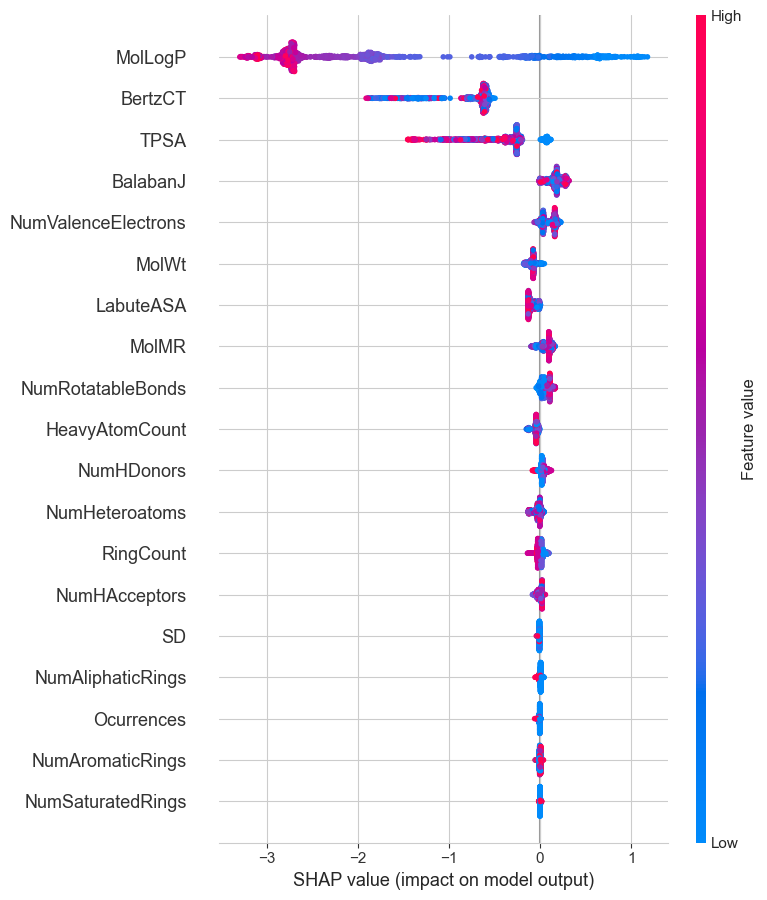

<Figure size 640x480 with 0 Axes>

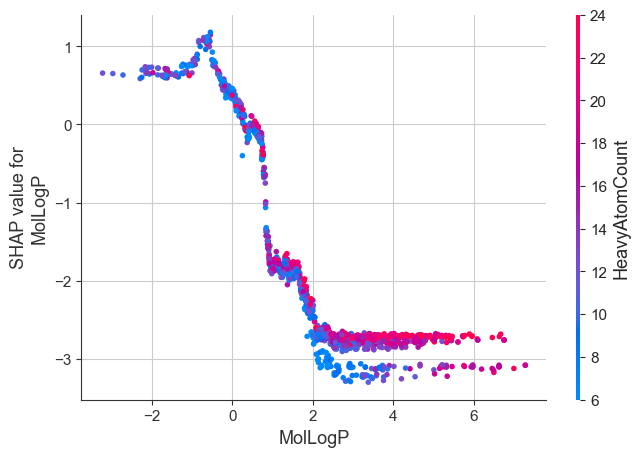

<Figure size 640x480 with 0 Axes>

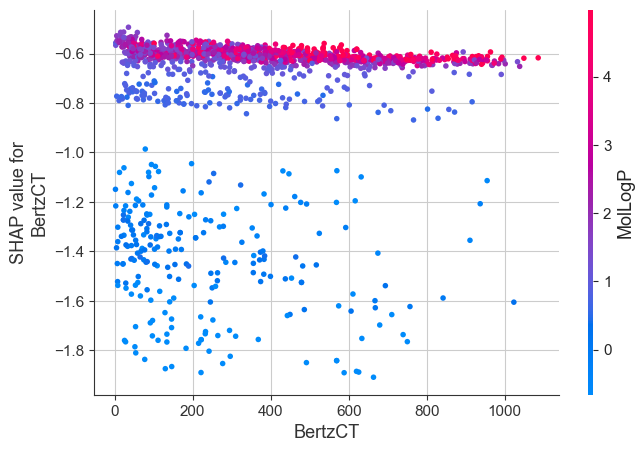

<Figure size 640x480 with 0 Axes>

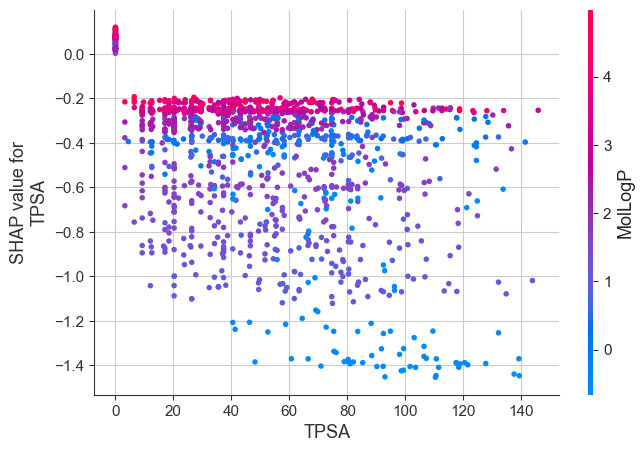

<Figure size 640x480 with 0 Axes>

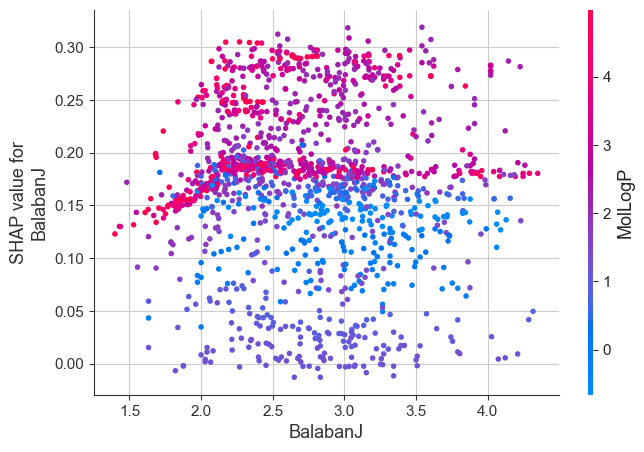

<Figure size 640x480 with 0 Axes>

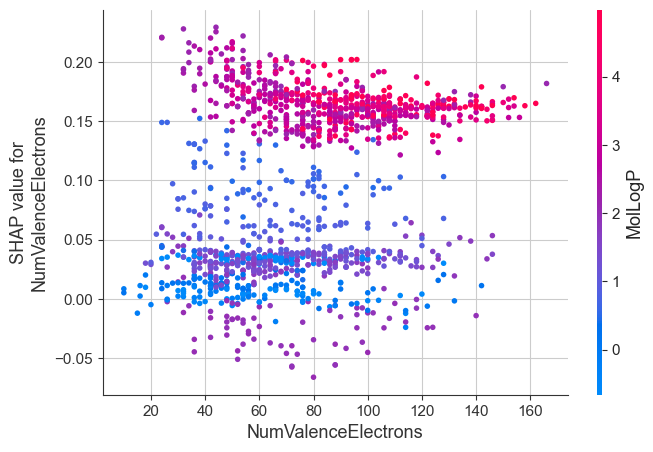

Force plot saved as 'shap_force_plot.html'. Open this file in a web browser to view it.


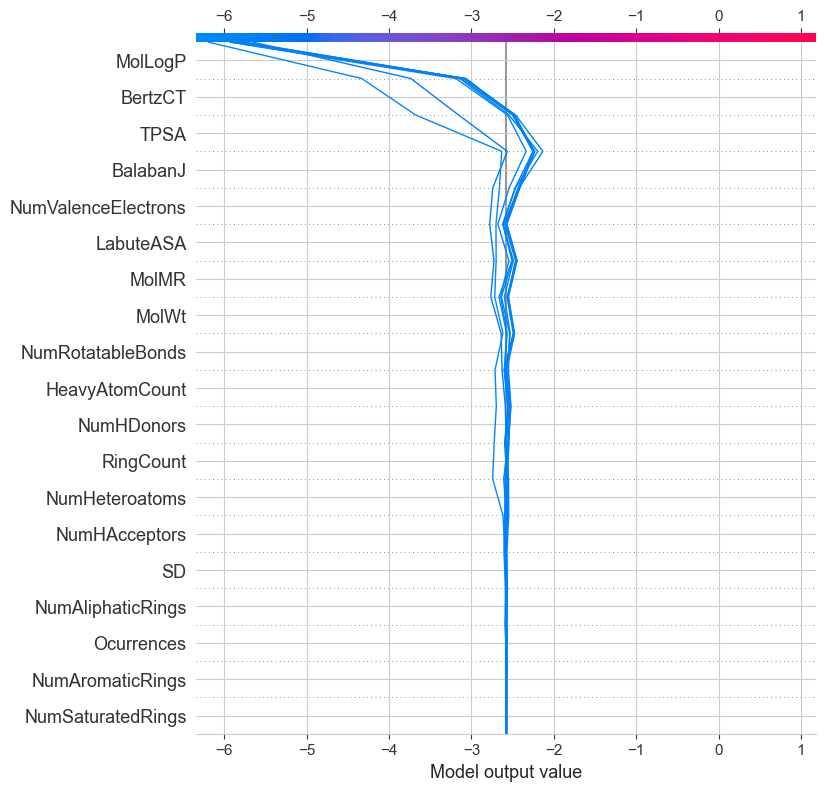

Summary plot saved as 'shap_summary_plot.png'.
Dependence plot for MolLogP saved as 'shap_dependence_plot_MolLogP.png'.
Dependence plot for BertzCT saved as 'shap_dependence_plot_BertzCT.png'.
Dependence plot for TPSA saved as 'shap_dependence_plot_TPSA.png'.
Dependence plot for BalabanJ saved as 'shap_dependence_plot_BalabanJ.png'.
Dependence plot for NumValenceElectrons saved as 'shap_dependence_plot_NumValenceElectrons.png'.


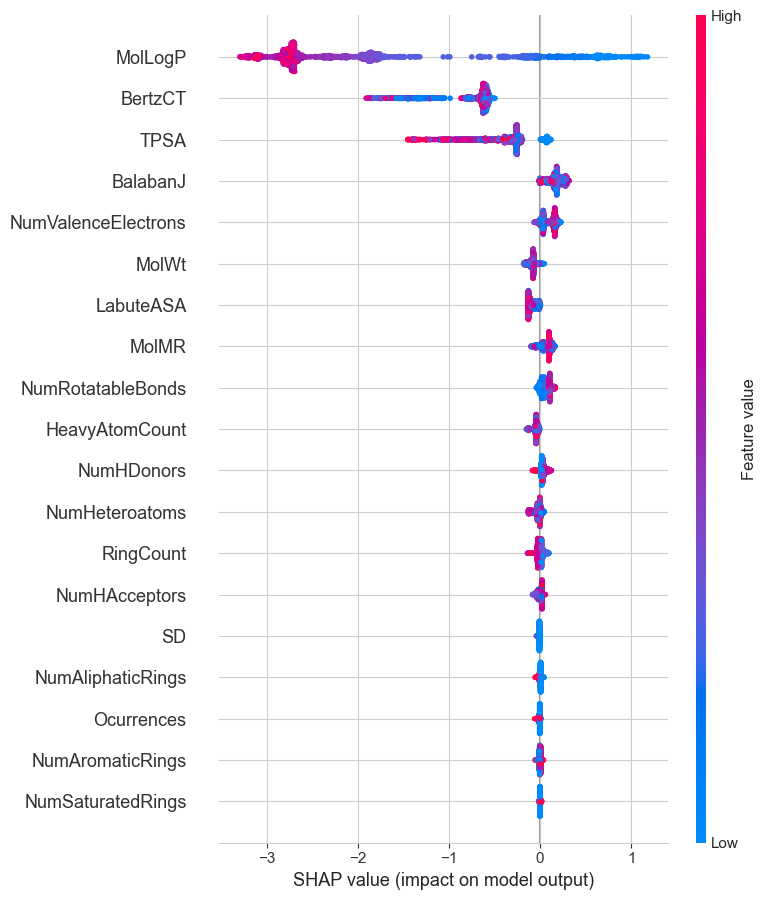

<Figure size 640x480 with 0 Axes>

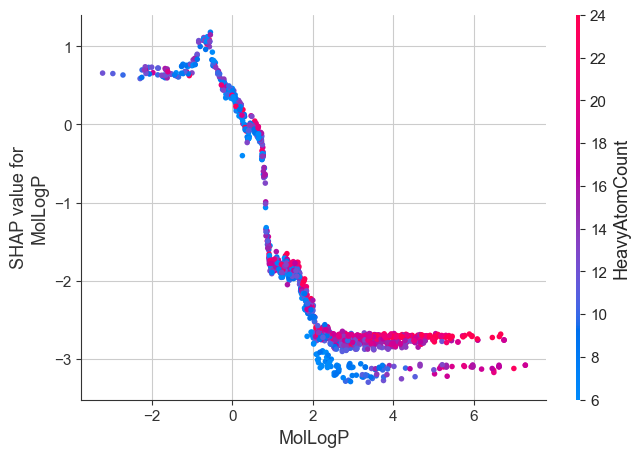

<Figure size 640x480 with 0 Axes>

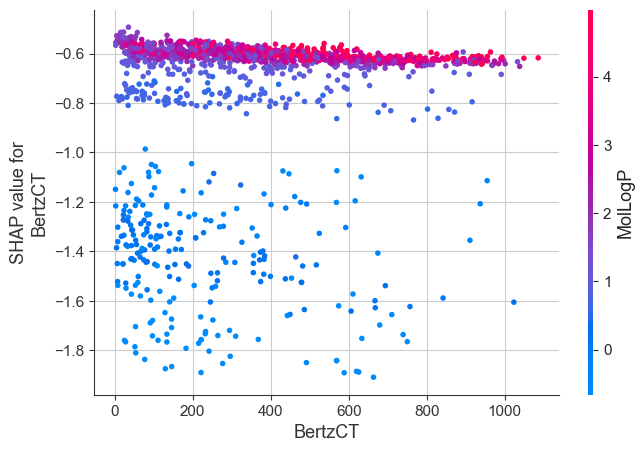

<Figure size 640x480 with 0 Axes>

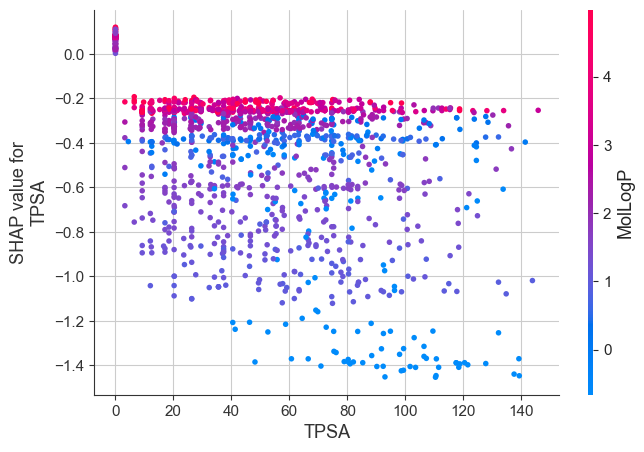

<Figure size 640x480 with 0 Axes>

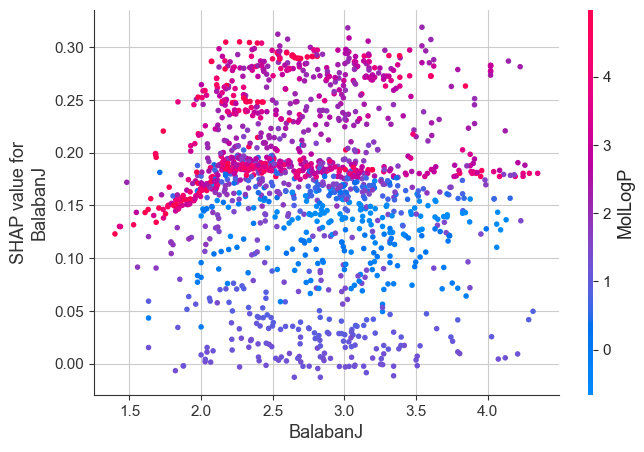

<Figure size 640x480 with 0 Axes>

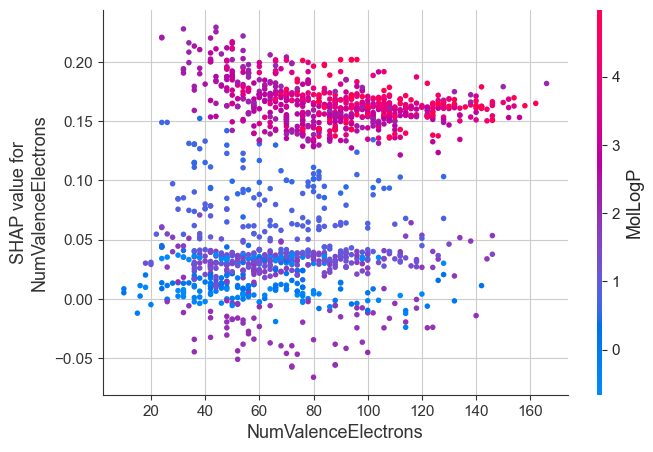

In [20]:
import shap

# Load the dataset
data_path = r'C:\Users\Romie\Documents\Chem413\Project1'
df = pd.read_csv(os.path.join(data_path, 'cleaned_solubility_dataset.csv'))

# Check for non-numeric columns
non_numeric_columns = df.select_dtypes(exclude=[np.number]).columns
print("Non-numeric columns:", non_numeric_columns)

# Remove non-numeric columns
df = df.drop(non_numeric_columns, axis=1)

# Split data into features and target
X = df.drop('Solubility', axis=1)
y = df['Solubility']

# Get the feature names as a list
feature_names = X.columns.tolist()

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train a model (e.g., RandomForestRegressor)
rf_model = RandomForestRegressor()
rf_model.fit(X_train_scaled, y_train)

# Ensure SHAP's JavaScript library is initialized
shap.initjs()

# Initialize SHAP Explainer
explainer = shap.TreeExplainer(rf_model)

# Compute SHAP values using unscaled test data
shap_values = explainer.shap_values(X_test)

# Summary Plot
plt.figure()
shap.summary_plot(shap_values, X_test, feature_names=feature_names)

# Dependence Plots for Key Features
top_features = ['MolLogP', 'BertzCT', 'TPSA', 'BalabanJ', 'NumValenceElectrons']  # Adjust based on summary plot
for feature in top_features:
    plt.figure()
    shap.dependence_plot(feature, shap_values, X_test, feature_names=feature_names)

# Force Plot for a Single Prediction
index = 0  # Select the index for the prediction to analyze
force_plot = shap.force_plot(explainer.expected_value, shap_values[index], X_test.iloc[index], feature_names=feature_names)

# Save Force Plot as HTML
shap.save_html("shap_force_plot.html", force_plot)
print("Force plot saved as 'shap_force_plot.html'. Open this file in a web browser to view it.")

# Decision Plot for Cumulative Feature Contributions
shap.decision_plot(explainer.expected_value, shap_values[:10], feature_names=feature_names)

# Save Summary and Dependence Plots as PNG
plt.figure()
shap.summary_plot(shap_values, X_test, feature_names=feature_names, show=False)
plt.savefig("shap_summary_plot.png", dpi=300, bbox_inches="tight")
print("Summary plot saved as 'shap_summary_plot.png'.")

for feature in top_features:
    plt.figure()
    shap.dependence_plot(feature, shap_values, X_test, feature_names=feature_names, show=False)
    plt.savefig(f"shap_dependence_plot_{feature}.png", dpi=300, bbox_inches="tight")
    print(f"Dependence plot for {feature} saved as 'shap_dependence_plot_{feature}.png'.")
    
    
    
    
##################################### end ####################################

In [21]:
from lime.lime_tabular import LimeTabularExplainer

# Initialize the LIME Explainer
explainer = LimeTabularExplainer(
    X_train_scaled, 
    mode="regression", 
    training_labels=y_train, 
    feature_names=feature_names,
    discretize_continuous=True
)

# Select a specific sample from the test set
index = 0  # Adjust this to explore other instances
sample = X_test_scaled[index].reshape(1, -1)
true_value = y_test.iloc[index]

# Generate explanation for the selected sample
explanation = explainer.explain_instance(
    sample[0], 
    rf_model.predict, 
    num_features=5
)

# Display explanation
explanation.show_in_notebook(show_table=True)

# Save the explanation to an HTML file
explanation.save_to_file("lime_explanation.html")
print("LIME explanation saved as 'lime_explanation.html'. Open this file in a web browser to view it.")

LIME explanation saved as 'lime_explanation.html'. Open this file in a web browser to view it.


In [22]:
from lime.lime_tabular import LimeTabularExplainer
from html2image import Html2Image
import webbrowser

# Create a LIME explainer for regression
lime_explainer = LimeTabularExplainer(
    X_train.values,
    mode="regression",   # Set mode to regression
    feature_names=X.columns,
    discretize_continuous=True
)

# Explain an instance from the test set
index = 0  # Adjust this index to explore other instances
if index < len(X_test):
    exp = lime_explainer.explain_instance(
        X_test.values[index],  # Use the original test data
        rf_model.predict,      # Use the regression model's predict method
        num_features=10        # Number of features to display in explanation
    )

    # Define output directory and file path for saving explanation
    output_dir = 'C:\\Users\\Romie\\Documents\\Chem413\\Project1'
    output_html_file = os.path.join(output_dir, "lime_explanation.html")
    
    # Save the explanation as HTML
    exp.save_to_file(output_html_file)
    print(f"LIME explanation saved as '{output_html_file}'.")

    # Convert HTML to PNG using html2image
    hti = Html2Image()
    
    # Specify the output PNG file path
    output_png_file = os.path.join(output_dir, "lime_explanation.png")
    
    try:
        # Convert and save as PNG
        hti.screenshot(html_file=output_html_file, save_as='lime_explanation.png', size=(800, 600))
        print(f"LIME explanation saved as '{output_png_file}'.")
        webbrowser.open('file://' + output_png_file)  # Open in default web browser
    except Exception as e:
        print(f"Error converting HTML to PNG: {e}")
else:
    print("Index out of range. Please check the length of X_test.")

LIME explanation saved as 'C:\Users\Romie\Documents\Chem413\Project1\lime_explanation.html'.
LIME explanation saved as 'C:\Users\Romie\Documents\Chem413\Project1\lime_explanation.png'.


Explanation for index 0 saved to 'lime_explanations/lime_explanation_0.html'


Explanation for index 5 saved to 'lime_explanations/lime_explanation_5.html'


Explanation for index 10 saved to 'lime_explanations/lime_explanation_10.html'


Explanation for index 15 saved to 'lime_explanations/lime_explanation_15.html'


C:\Users\Romie\AppData\Local\Temp\ipykernel_21224\2554140641.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=aggregated_contributions, x='Contribution', y='Feature', palette='coolwarm')


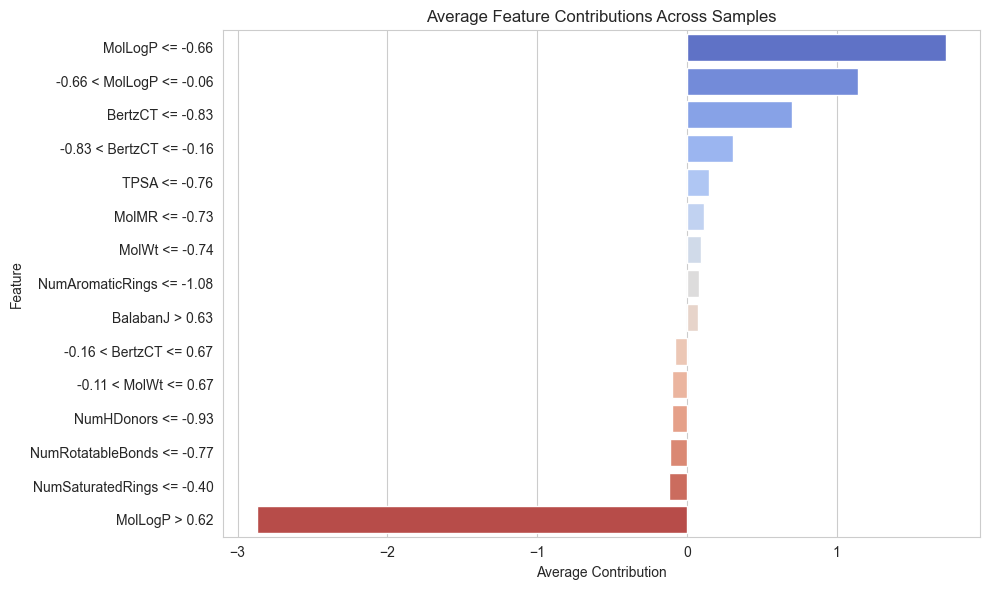

In [24]:
from lime.lime_tabular import LimeTabularExplainer

# Initialize the LIME Explainer
explainer = LimeTabularExplainer(
    X_train_scaled, 
    training_labels=y_train, 
    feature_names=feature_names,
    mode="regression", 
    discretize_continuous=True
)

# Function to explain and visualize multiple predictions
def explain_multiple_predictions(indices, model, X_test_scaled, y_test, feature_names, output_dir="lime_explanations"):
    """
    Explain multiple predictions using LIME and save results.
    
    Args:
        indices: List of indices to explain from the test set.
        model: Trained model to use for predictions.
        X_test_scaled: Scaled test set features.
        y_test: True test set labels.
        feature_names: List of feature names.
        output_dir: Directory to save LIME explanations as HTML files.
    """
    # Ensure output directory exists
    os.makedirs(output_dir, exist_ok=True)

    explanations_summary = []  # Store feature contributions for comparisons

    for index in indices:
        # Get the sample to explain
        sample = X_test_scaled[index].reshape(1, -1)
        true_value = y_test.iloc[index]
        
        # Generate explanation
        explanation = explainer.explain_instance(
            sample[0], 
            model.predict, 
            num_features=5
        )
        
        # Display explanation in the notebook
        explanation.show_in_notebook(show_table=True)
        
        # Save explanation as an HTML file
        explanation.save_to_file(f"{output_dir}/lime_explanation_{index}.html")
        print(f"Explanation for index {index} saved to '{output_dir}/lime_explanation_{index}.html'")
        
        # Store the top feature contributions for comparison
        exp_features = pd.DataFrame(explanation.as_list(), columns=['Feature', 'Contribution'])
        exp_features['Index'] = index
        explanations_summary.append(exp_features)
    
    # Combine all feature contributions into a single DataFrame for analysis
    explanations_summary_df = pd.concat(explanations_summary, ignore_index=True)

    # Aggregate contributions across samples for comparison
    aggregated_contributions = (
        explanations_summary_df.groupby('Feature')['Contribution']
        .mean()
        .sort_values(ascending=False)
        .reset_index()
    )
    
    # Visualize aggregated contributions
    plt.figure(figsize=(10, 6))
    sns.barplot(data=aggregated_contributions, x='Contribution', y='Feature', palette='coolwarm')
    plt.title('Average Feature Contributions Across Samples')
    plt.xlabel('Average Contribution')
    plt.ylabel('Feature')
    plt.tight_layout()
    plt.show()
    
    return explanations_summary_df

# Define indices of test samples to explain
sample_indices = [0, 5, 10, 15]  # Modify as needed to include other indices

# Explain multiple predictions and compare feature contributions
explanations_summary_df = explain_multiple_predictions(
    indices=sample_indices, 
    model=rf_model, 
    X_test_scaled=X_test_scaled, 
    y_test=y_test, 
    feature_names=feature_names,
)


Curated Data Columns: Index(['ID', 'Name', 'InChI', 'InChIKey', 'SMILES', 'Solubility', 'SD',
       'Ocurrences', 'Group', 'MolWt', 'MolLogP', 'MolMR', 'HeavyAtomCount',
       'NumHAcceptors', 'NumHDonors', 'NumHeteroatoms', 'NumRotatableBonds',
       'NumValenceElectrons', 'NumAromaticRings', 'NumSaturatedRings',
       'NumAliphaticRings', 'RingCount', 'TPSA', 'LabuteASA', 'BalabanJ',
       'BertzCT'],
      dtype='object')
Cleaned Data Columns: Index(['ID', 'Name', 'InChI', 'InChIKey', 'SMILES', 'Solubility', 'SD',
       'Ocurrences', 'Group', 'MolWt', 'MolLogP', 'MolMR', 'HeavyAtomCount',
       'NumHAcceptors', 'NumHDonors', 'NumHeteroatoms', 'NumRotatableBonds',
       'NumValenceElectrons', 'NumAromaticRings', 'NumSaturatedRings',
       'NumAliphaticRings', 'RingCount', 'TPSA', 'LabuteASA', 'BalabanJ',
       'BertzCT'],
      dtype='object')


[21:36:33] WARNING: not removing hydrogen atom without neighbors
[21:36:33] WARNING: not removing hydrogen atom without neighbors
[21:36:33] WARNING: not removing hydrogen atom without neighbors
[21:36:33] WARNING: not removing hydrogen atom without neighbors
[21:36:33] WARNING: not removing hydrogen atom without neighbors
[21:36:33] WARNING: not removing hydrogen atom without neighbors
[21:36:33] WARNING: not removing hydrogen atom without neighbors
[21:36:33] WARNING: not removing hydrogen atom without neighbors
[21:36:33] WARNING: not removing hydrogen atom without neighbors
[21:36:33] WARNING: not removing hydrogen atom without neighbors
[21:36:33] WARNING: not removing hydrogen atom without neighbors
[21:36:33] WARNING: not removing hydrogen atom without neighbors
[21:36:33] WARNING: not removing hydrogen atom without neighbors
[21:36:33] WARNING: not removing hydrogen atom without neighbors
[21:36:33] WARNING: not removing hydrogen atom without neighbors
[21:36:33] WARNING: not r

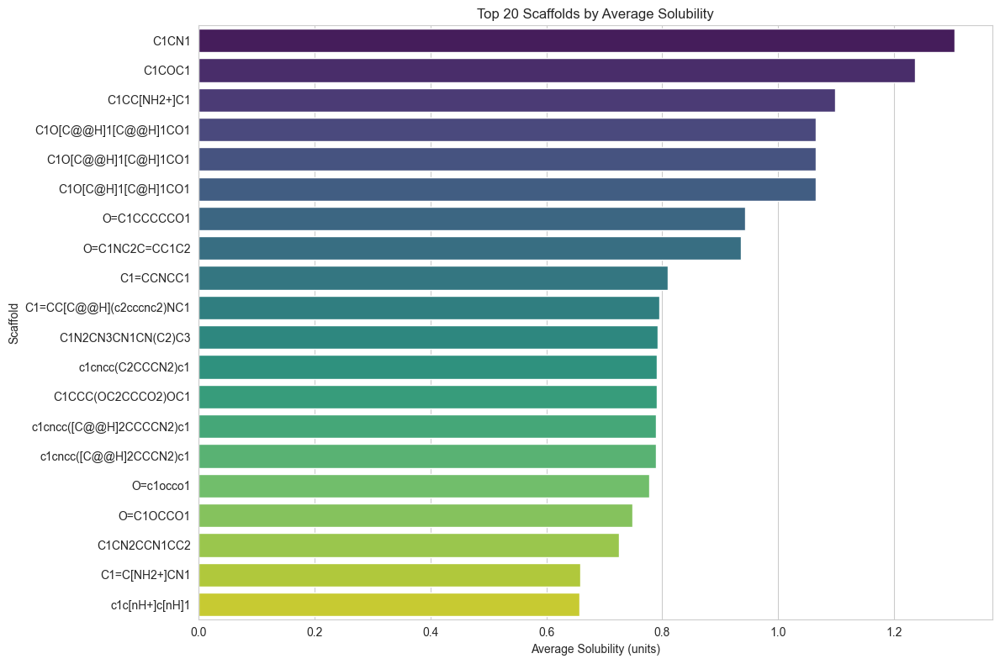

In [25]:
from rdkit.Chem import rdmolops
from rdkit.Chem.Scaffolds import MurckoScaffold

# Inspect the columns to find SMILES or InChI
print("Curated Data Columns:", curated_data.columns)
print("Cleaned Data Columns:", cleaned_data.columns)

# Assuming 'SMILES' is a column in your dataset containing SMILES representations
smiles_column = 'SMILES'  # Adjust this to your actual column name

# Function to extract scaffolds from SMILES
def extract_scaffold(smiles):
    try:
        mol = Chem.MolFromSmiles(smiles)
        if mol is not None:
            scaffold = MurckoScaffold.GetScaffoldForMol(mol)
            return Chem.MolToSmiles(scaffold)
        else:
            return None
    except Exception as e:
        return None

# Extract scaffolds from curated data
curated_data['Scaffold'] = curated_data[smiles_column].apply(extract_scaffold)

# Analyze how different scaffolds relate to solubility
# Assuming solubility is in a column named 'solubility'
solubility_column = 'Solubility'  # Adjust this to your actual column name

# Merge scaffold information with solubility data
scaffold_solubility = curated_data[['Scaffold', solubility_column]].dropna()

# Group by scaffold and calculate average solubility
scaffold_analysis = scaffold_solubility.groupby('Scaffold')[solubility_column].mean().reset_index()

# Sort by average solubility
scaffold_analysis.sort_values(by=solubility_column, ascending=False, inplace=True)

# Visualize the results
plt.figure(figsize=(12, 8))
sns.barplot(data=scaffold_analysis.head(20), x=solubility_column, y='Scaffold', palette='viridis')
plt.title('Top 20 Scaffolds by Average Solubility')
plt.xlabel('Average Solubility (units)')
plt.ylabel('Scaffold')
plt.tight_layout()
plt.show()
